## 1. 분석 환경 설정 및 데이터 불러오기

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import statistics
import pm4py

## 2. 데이터 전처리

In [34]:
df = pd.read_csv('repair2.csv')
df # 데이터 살펴보기

,caseID,taskID,originator,eventtype,contact,RepairType,objectKey,RepairInternally,EstimatedRepairTime,RepairCode,RepairOK,date,time
0,419,InformClientSurvey,System,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-06,11:51
1,561,ArrangeSurvey,Monica,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-07,13:48
2,902,ReadyInformClient,System,complete,NaN,NaN,NaN,NaN,NaN,NaN,True,2020-01-08,16:20
3,18,Survey,Edd,start,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-09,6:55
4,852,Survey,Edd,complete,NaN,NaN,NaN,True,240.0,1.0,NaN,2020-01-10,11:33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13257,707,ArrangeSurvey,Dian,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-07,0:16
13258,25,ArrangeSurvey,Dian,start,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-02,7:48
13259,762,ArrangeSurvey,Monica,start,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-03,11:53
13260,12,InternRepair,Cindy,start,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1970-01-08,18:10


In [35]:
df.info() # 데이터프레임 정보를 출력해 결측과 데이터 타입 확인

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13262 entries, 0 to 13261
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   caseID               13262 non-null  int64  
 1   taskID               13260 non-null  object 
 2   originator           13260 non-null  object 
 3   eventtype            13257 non-null  object 
 4   contact              1000 non-null   object 
 5   RepairType           927 non-null    object 
 6   objectKey            927 non-null    float64
 7   RepairInternally     927 non-null    object 
 8   EstimatedRepairTime  927 non-null    float64
 9   RepairCode           927 non-null    float64
 10  RepairOK             1854 non-null   object 
 11  date                 13249 non-null  object 
 12  time                 13249 non-null  object 
dtypes: float64(3), int64(1), object(9)
memory usage: 1.3+ MB


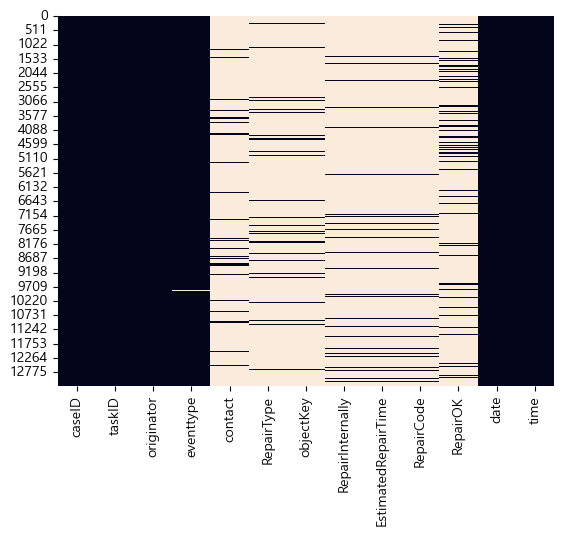

In [291]:
df = pd.read_csv('repair2.csv')

# 결측 히트맵 
sns.heatmap(df.isnull(), cbar=False)
plt.show()

In [293]:
df.duplicated().sum()

np.int64(0)

In [36]:
# datetime 컬럼 생성

df['datetime'] = pd.to_datetime(df['date'] + ' ' + df['time'], errors='coerce')

In [37]:
# caseID의 날짜 분포 확인
fig = px.histogram(df, x='date', nbins=30, title='CaseID Date Distribution')
fig.show()

데이터를 살펴보았을때 1970년 데이터가 발견되어 데이터에 이상치 혹은 잘못 기록된 데이터가 존재함을 확인

- 문제점:
    - 원본 데이터에서 다수의 이벤트가 1970-01-02 등으로 잘못 기록되어 있음.

- 원인 가설:
    - 2020년 초 시스템 마이그레이션 또는 대규모 업데이트 과정에서 날짜 필드 초기화 발생.

- 특징:

    - originator, taskID 등 비즈니스 이벤트 자체는 정상.

    - time 값은 유효하므로, 날짜(date)만 덮어쓰기 오류 가능성이 높음.

- 해결 전략:
    → 1970년으로 기록된 모든 이벤트를 2020년 동일 월·일·시간으로 일괄 보정.

장점
- 데이터 손실을 최소화 → 비즈니스 분석에 필요한 이벤트를 최대한 보존.
- 프로세스 마이닝에서 실제 흐름을 복원할 수 있음.
- time 값은 유지하므로 상대적인 이벤트 순서에 영향 없음.

단점 및 주의점
- 정확한 날짜 보장은 불가능: 실제 이벤트가 정확히 언제 발생했는지는 알 수 없음.
- 가설 기반 분석

데이터를 살펴보았을때 1970년 데이터가 발견되어 데이터에 이상치 혹은 잘못 기록된 데이터가 존재함을 확인 -> 전처리 필요?

| 연도              | 이벤트 수  | 특징                                    |
| --------------- | ------ | ------------------------------------- |
| **1970년**       | 12,383 | 전체의 90% 이상, 정상 이벤트이지만 date 오입력 가능성 있음 |
| **1905년**       | 6      | date, time 모두 잘못 입력 가능성               |
| **2020\~2022년** | 860    | 정상 이벤트로 판단                            |
| NaT             | 13     | `date` 또는 `time` 결측치 → 제거 필요          |


In [38]:
# 1970년 데이터 → 2020년으로 대치
mask_1970 = df['datetime'].dt.year == 1970
df.loc[mask_1970, 'datetime'] = df.loc[mask_1970, 'datetime'].apply(
    lambda x: x.replace(year=2020)
)

# 1905년 데이터도 동일하게 보정
mask_1905 = df['datetime'].dt.year == 1905
df.loc[mask_1905, 'datetime'] = df.loc[mask_1905, 'datetime'].apply(
    lambda x: x.replace(year=2020)
)

# date, time 필드도 다시 생성
df['date'] = df['datetime'].dt.date
df['time'] = df['datetime'].dt.time

In [39]:
df_sorted = df.sort_values(by=['caseID', 'datetime']).reset_index(drop=True)

In [40]:
df_sorted.to_csv('repair_fixed.csv', index=False) # 수정된 데이터 저장

In [41]:
# 보정 이후 caseID의 날짜 분포 확인
fig = px.histogram(df_sorted, x='date', nbins=30, title='CaseID Date Distribution')
fig.show()

In [44]:
df_sorted['taskID'].value_counts() # taskID의 고유값과 빈도수 확인

taskID
MakeTicket                1854
ArrangeSurvey             1854
Survey                    1854
InternRepair              1094
FirstContact               999
TicketReady                927
RepairReady                927
ReadyInformClient          927
SendTicketToFinAdmin       927
InformClientSurvey         926
ImmediateRepair            766
ExternRepair               132
InformClientWrongPlace      73
Name: count, dtype: int64

### 문제 상황

- caseID별로 확인한 결과:

    - 주요 연도(major year)가 2020년인 케이스에서 일부 이벤트만 2021 또는 2022로 기록된 경우가 399개 case에서 발견됨.

예시:

- caseID=8 → 대부분 2020년인데 RepairReady만 2021년

- caseID=71 → 대부분 2020년인데 MakeTicket만 2022년

- time 값은 정상적이어서 date 필드만 잘못 덮어씌워진 패턴으로 보임.

원인: 

- 2020년 초 시스템 업그레이드나 데이터 마이그레이션 과정에서 일부 이벤트의 date 필드가 잘못 입력되었을 가능성이 높음.

- taskID, originator, RepairType 등 다른 필드는 정상적이므로, 이벤트 자체는 유효하다고 보는 것이 합리적.


### 전처리 방안
대상:

- caseID의 주요 연도(major year)가 2020년인 케이스에서
- 일부 이벤트의 연도만 2021 또는 2022로 튀는 이벤트

처리 방법

- 해당 이벤트의 연도를 모두 2020년으로 보정
- 월, 일, 시간은 그대로 유지

In [45]:
# caseID, datetime 순으로 정렬
df_cleaned = df_sorted.copy()

# case별 주요 연도(가장 많은 연도) 계산
case_major_year = df_cleaned.groupby('caseID')['datetime'].apply(
    lambda x: x.dt.year.mode()[0] if not x.dt.year.mode().empty else None
)

# case별 주요 연도를 병합
df_cleaned = df_cleaned.merge(case_major_year.rename('case_major_year'), on='caseID', how='left')

# 주요 연도가 2020인데, 개별 이벤트 연도가 2021 또는 2022인 경우 탐지
suspect_events = df_cleaned[
    (df_cleaned['case_major_year'] == 2020) & 
    (df_cleaned['datetime'].dt.year.isin([2021, 2022]))
]

# 의심 케이스 수
suspect_case_count = suspect_events['caseID'].nunique()

# 샘플 20개 출력
suspect_sample = suspect_events.groupby('caseID').head(20)

suspect_case_count, suspect_sample.head(20)

(399,
      caseID                taskID originator eventtype contact RepairType  \
 28        2           RepairReady     System  complete     NaN        NaN   
 88        8           RepairReady     System  complete     NaN        NaN   
 116      10       ImmediateRepair      Jacky  complete     NaN        NaN   
 129      11                Survey       Anne     start     NaN        NaN   
 130      11            MakeTicket       Dian     start     NaN        NaN   
 146      12    InformClientSurvey     System  complete     NaN        NaN   
 162      14       ImmediateRepair      Jacky  complete     NaN        NaN   
 191      16       ImmediateRepair      Jacky     start     NaN        NaN   
 204      17  SendTicketToFinAdmin     System  complete     NaN        NaN   
 219      18  SendTicketToFinAdmin     System  complete     NaN        NaN   
 233      19                Survey       Anne  complete     NaN        NaN   
 261      21  SendTicketToFinAdmin     System  complete   

In [46]:
mask_fix = (
    (df_cleaned['case_major_year'] == 2020) & 
    (df_cleaned['datetime'].dt.year.isin([2021, 2022]))
)

df_cleaned.loc[mask_fix, 'datetime'] = df_cleaned.loc[mask_fix, 'datetime'].apply(
    lambda x: x.replace(year=2020)
)

# date, time 컬럼 갱신
df_cleaned['date'] = df_cleaned['datetime'].dt.date
df_cleaned['time'] = df_cleaned['datetime'].dt.time

# 결과 저장
df_cleaned.to_csv("cleaned_repair2_v2.csv", index=False)


### 전처리 전략
- 문제 정의

    - caseID별로 **정상 이벤트들의 월(month)**을 기준으로 이상치를 탐지.

    - 예: caseID=8 → 대부분 1월인데 RepairReady가 6월 → 이상치로 간주.

- 처리 기준

    - 동일 caseID에서 **major month(가장 빈도가 높은 월)**를 기준으로 보정:

    - caseID 내 이벤트들의 월 빈도수 계산 → 최빈값(mode) 사용.

    - 최빈 월과 다른 이벤트는 월만 최빈값으로 덮어씀.

    - 시간(time)과 일(day)은 그대로 유지.

In [48]:
import pandas as pd

# 데이터 로드
df = pd.read_csv("cleaned_repair2_v2.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# datetime이 유효하지 않은 행은 처리에 영향을 줄 수 있으므로 먼저 제거합니다.
df.dropna(subset=['datetime'], inplace=True)

# `transform`을 사용하여 각 case의 최빈 월을 계산하고 'case_major_month' 열에 할당합니다.
# `merge`보다 효율적이며, `mode()`가 float을 반환할 수 있습니다.
# 데이터가 없는 그룹을 고려하여 안정성을 높입니다.
df['case_major_month'] = df.groupby('caseID')['datetime'].transform(
    lambda x: x.dt.month.mode()[0] if not x.empty else pd.NA
)

# 월이 튀는 이벤트 감지. case_major_month가 NA인 행은 자동으로 비교에서 제외됩니다.
mask_fix_month = df['datetime'].dt.month != df['case_major_month']

# 튀는 월을 최빈 월로 덮어쓰기
# 에러의 원인인 float 타입을 int()로 감싸 정수로 변환합니다.
if mask_fix_month.any():
    df.loc[mask_fix_month, 'datetime'] = df.loc[mask_fix_month].apply(
        lambda row: row['datetime'].replace(month=int(row['case_major_month'])), axis=1
    )

# 임시 열을 삭제하고 date, time 갱신
df.drop(columns=['case_major_month'], inplace=True)
df['date'] = df['datetime'].dt.date
df['time'] = df['datetime'].dt.time

# 결과 저장
df.to_csv("cleaned_repair2_v3.csv", index=False)

print("월 보정 작업 완료. 'cleaned_repair2_v3.csv' 파일이 저장되었습니다.")

월 보정 작업 완료. 'cleaned_repair2_v3.csv' 파일이 저장되었습니다.


In [49]:
import pandas as pd
from datetime import timedelta

# 데이터 로드
df = pd.read_csv("cleaned_repair2_v3.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# caseID별 datetime 정렬
df = df.sort_values(by=['caseID', 'datetime']).reset_index(drop=True)

# case별 major date 계산 (가장 많이 등장하는 날짜)
df['date_only'] = df['datetime'].dt.date
case_major_date = df.groupby('caseID')['date_only'].apply(lambda x: x.mode()[0])
df = df.merge(case_major_date.rename('case_major_date'), on='caseID', how='left')

# 이벤트 간 gap 계산
df['prev_datetime'] = df.groupby('caseID')['datetime'].shift(1)
df['gap_days'] = (df['datetime'] - df['prev_datetime']).dt.days

# 이상치 후보: gap 30일 초과 또는 major date에서 ±30일 이상 벗어난 경우
df['day_outlier'] = (
    (df['gap_days'] > 30) |
    (abs((df['datetime'] - pd.to_datetime(df['case_major_date'])).dt.days) > 30)
)

# 이상치 보정 → major date로 보정하되 time 유지
df.loc[df['day_outlier'], 'datetime'] = df.loc[df['day_outlier']].apply(
    lambda row: pd.Timestamp.combine(row['case_major_date'], row['datetime'].time()), axis=1
)

# date, time 다시 갱신
df['date'] = df['datetime'].dt.date
df['time'] = df['datetime'].dt.time

# 최종 저장
df.to_csv("cleaned_repair2_v4.csv", index=False)


## 3. 탐색적 자료 분석

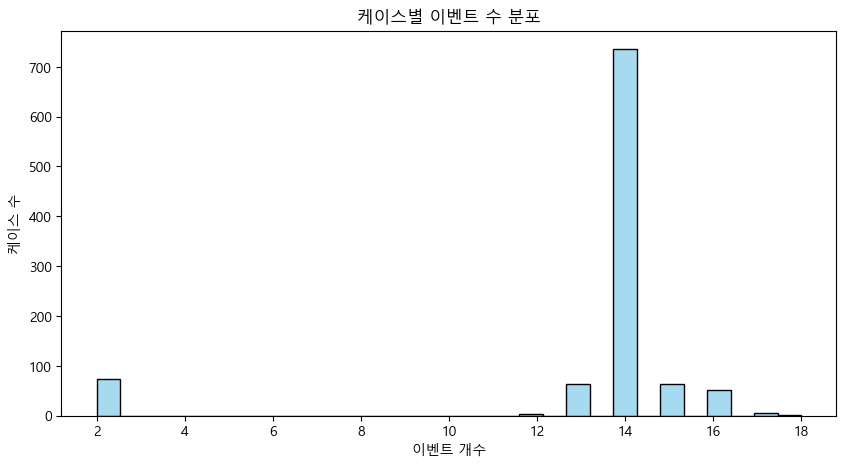

In [51]:
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

df = pd.read_csv("cleaned_repair2_final.csv")
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# -------------------------------
# (1) 케이스 단위 프로세스 분석
# -------------------------------

# 케이스별 이벤트 수
case_event_counts = df.groupby('caseID')['taskID'].count()

# 케이스별 소요 시간
case_duration = df.groupby('caseID').agg(start_time=('datetime', 'min'),
                                         end_time=('datetime', 'max'))
case_duration['duration_minutes'] = (case_duration['end_time'] - case_duration['start_time']).dt.total_seconds() / 60

# 케이스별 태스크 수
case_task_counts = df.groupby('caseID')['taskID'].nunique()

# 시각화: 케이스별 이벤트 수 분포
plt.figure(figsize=(10,5))
sns.histplot(case_event_counts, bins=30, kde=False, color="skyblue")
plt.title("케이스별 이벤트 수 분포")
plt.xlabel("이벤트 개수")
plt.ylabel("케이스 수")
plt.show()

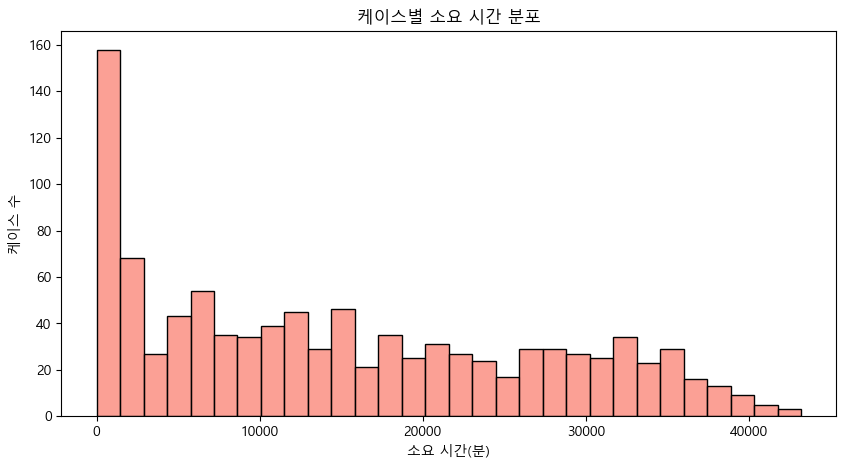

In [52]:
# 시각화: 케이스별 소요 시간 분포
plt.figure(figsize=(10,5))
sns.histplot(case_duration['duration_minutes'], bins=30, kde=False, color="salmon")
plt.title("케이스별 소요 시간 분포")
plt.xlabel("소요 시간(분)")
plt.ylabel("케이스 수")
plt.show()

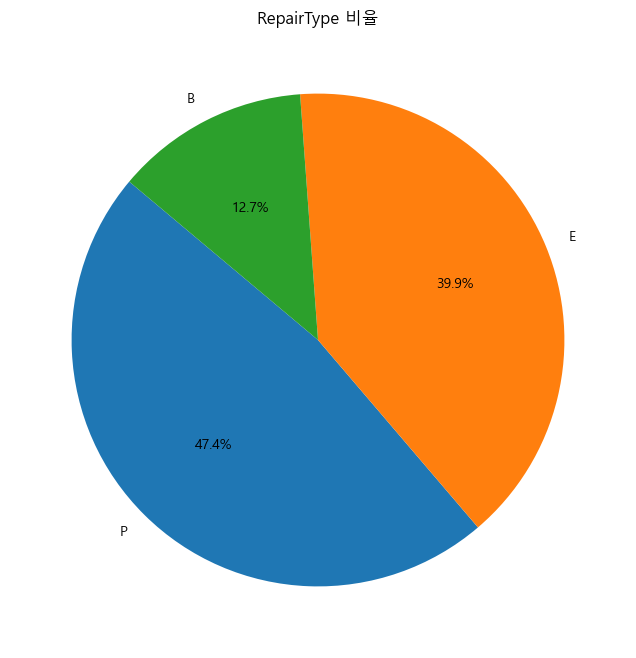

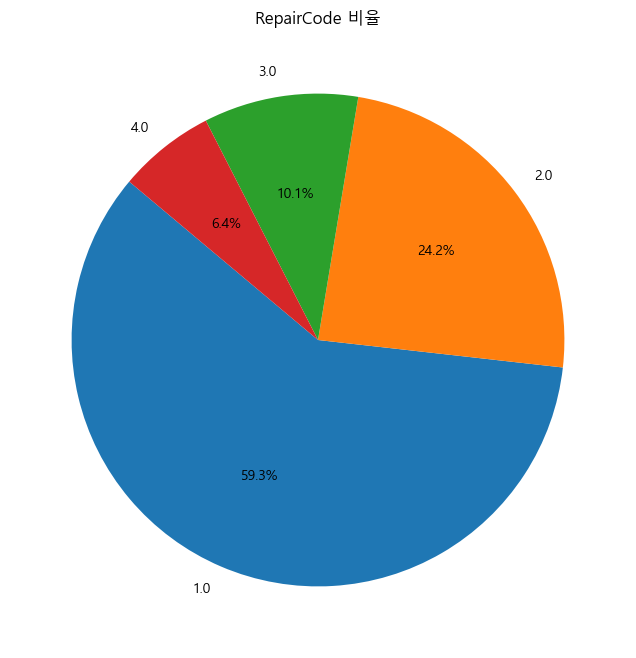

In [59]:
# NaN 제외한 RepairType 비율
repair_type_counts = df['RepairType'].dropna().value_counts()

# NaN 제외한 RepairCode 비율
repair_code_counts = df['RepairCode'].dropna().value_counts()

# 파이차트: RepairType
plt.figure(figsize=(8,8))
plt.pie(repair_type_counts, labels=repair_type_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("RepairType 비율")
plt.show()

# 파이차트: RepairCode
plt.figure(figsize=(8,8))
plt.pie(repair_code_counts, labels=repair_code_counts.index, autopct='%1.1f%%', startangle=140)
plt.title("RepairCode 비율")
plt.show()

In [60]:
originator_counts = df['originator'].value_counts()
print("\n[담당자별 이벤트 처리 건수]")
print(originator_counts)

# 이벤트 유형(eventtype)별 수
eventtype_counts = df['eventtype'].value_counts()
print("\n[이벤트 유형별 발생 건수]")
print(eventtype_counts)

# 이벤트 유형(eventtype)별 수
taskID_counts = df['taskID'].value_counts()
print("\n[이벤트 유형별 발생 건수]")
print(taskID_counts)


[담당자별 이벤트 처리 건수]
originator
System     4628
Monica     2534
Dian       2245
Anne        865
Jacky       438
Barbara     427
John        396
Cindy       388
Paul        385
Edd         372
Ben         120
Lex         112
Nick        108
Eric         98
DoIt         66
FixIt        65
Name: count, dtype: int64

[이벤트 유형별 발생 건수]
eventtype
complete    9408
start       3837
Name: count, dtype: int64

[이벤트 유형별 발생 건수]
taskID
MakeTicket                1854
ArrangeSurvey             1853
Survey                    1852
InternRepair              1094
FirstContact               998
SendTicketToFinAdmin       927
TicketReady                926
ReadyInformClient          925
RepairReady                925
InformClientSurvey         924
ImmediateRepair            765
ExternRepair               131
InformClientWrongPlace      73
Name: count, dtype: int64


C:\Users\Yoo\AppData\Local\Temp\ipykernel_7576\2562909607.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




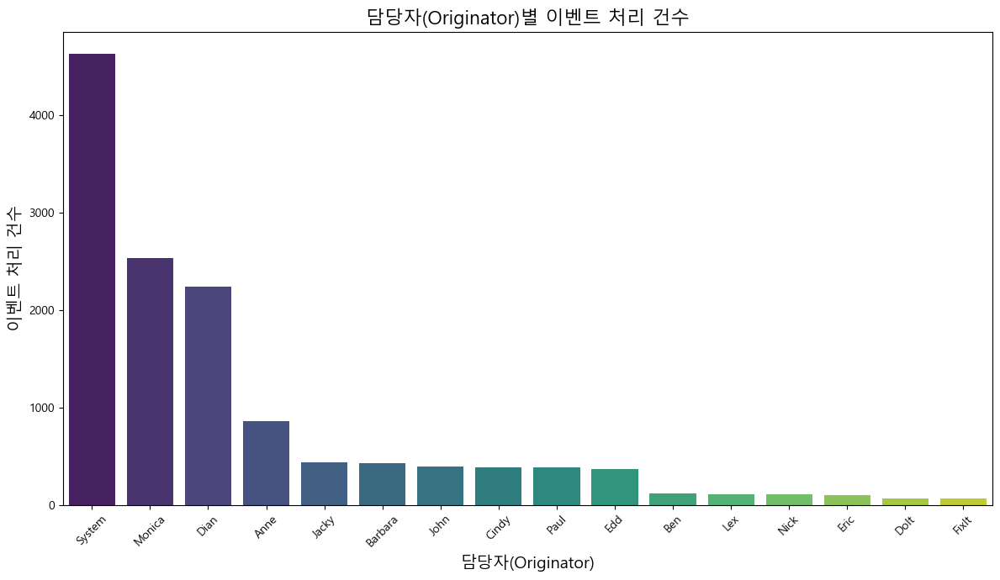

In [61]:
plt.figure(figsize=(12, 7))
sns.barplot(x=originator_counts.index, y=originator_counts.values, palette='viridis')
plt.title('담당자(Originator)별 이벤트 처리 건수', fontsize=16)
plt.xlabel('담당자(Originator)', fontsize=14)
plt.ylabel('이벤트 처리 건수', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

C:\Users\Yoo\AppData\Local\Temp\ipykernel_7576\1207082265.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




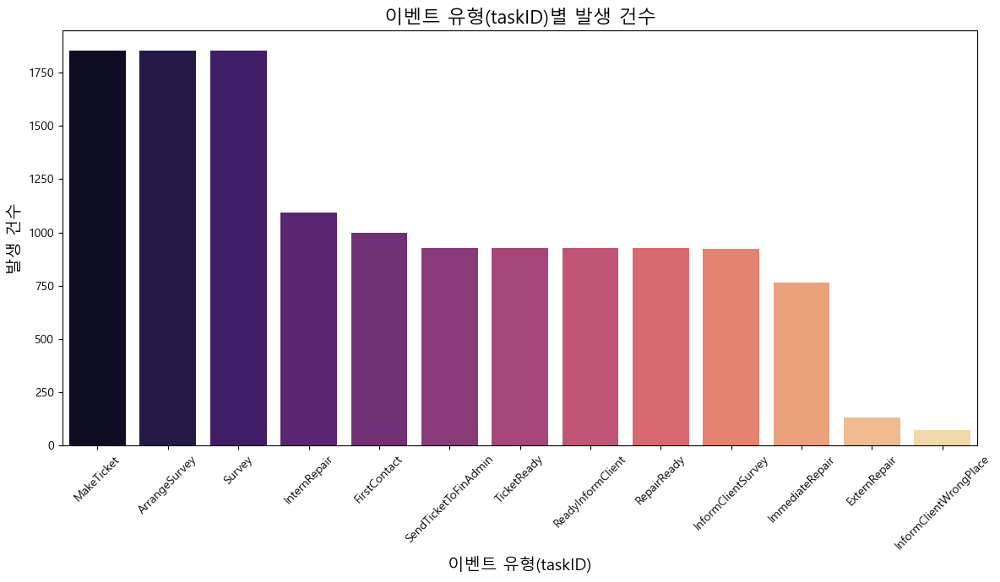

In [62]:
plt.figure(figsize=(12, 7))
sns.barplot(x=taskID_counts.index, y=taskID_counts.values, palette='magma')
plt.title('이벤트 유형(taskID)별 발생 건수', fontsize=16)
plt.xlabel('이벤트 유형(taskID)', fontsize=14)
plt.ylabel('발생 건수', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


[담당자별 이벤트 유형 처리 건수]
taskID      ArrangeSurvey  ExternRepair  FirstContact  ImmediateRepair  \
originator                                                               
Anne                    0             0             0              370   
Barbara                 0             0             0              175   
Ben                     0             0             0                8   
Cindy                   0             0             0                0   
Dian                  877             0           464                0   
DoIt                    0            66             0                0   
Edd                     0             0             0                0   
Eric                    0             0             0                8   
FixIt                   0            65             0                0   
Jacky                   0             0             0              184   
John                    0             0             0                0   
Lex              

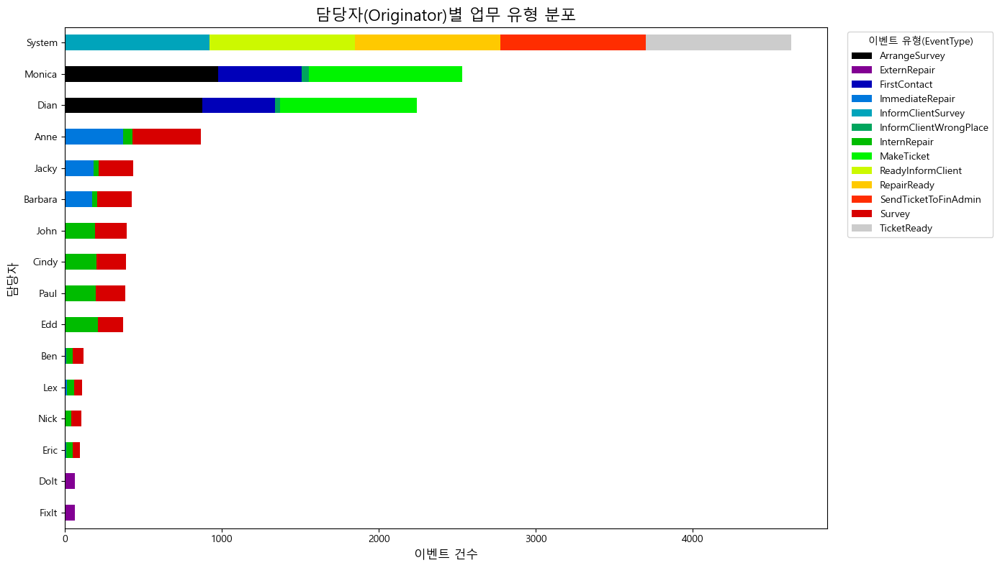

In [63]:
workload_crosstab = pd.crosstab(index=df['originator'], columns=df['taskID'])
print("\n[담당자별 이벤트 유형 처리 건수]")
print(workload_crosstab)

workload_crosstab['total'] = workload_crosstab.sum(axis=1)
workload_crosstab_sorted = workload_crosstab.sort_values('total', ascending=True).drop(columns='total')

# kind='barh'로 변경하여 가로 막대 그래프를 생성합니다.
workload_crosstab_sorted.plot(kind='barh', stacked=True, figsize=(14, 8), colormap='nipy_spectral')

# 제목과 라벨을 설정합니다.
plt.title('담당자(Originator)별 업무 유형 분포', fontsize=16)
plt.xlabel('이벤트 건수', fontsize=12) # x축 라벨을 '이벤트 건수'로 변경
plt.ylabel('담당자', fontsize=12)   # y축 라벨을 '담당자'로 변경

# 범례 위치를 조정합니다.
plt.legend(title='이벤트 유형(EventType)', bbox_to_anchor=(1.02, 1), loc='upper left')

# 레이아웃을 조정하고 그래프를 출력합니다.
plt.tight_layout()
plt.show()

C:\Users\Yoo\AppData\Local\Temp\ipykernel_7576\3195409696.py:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




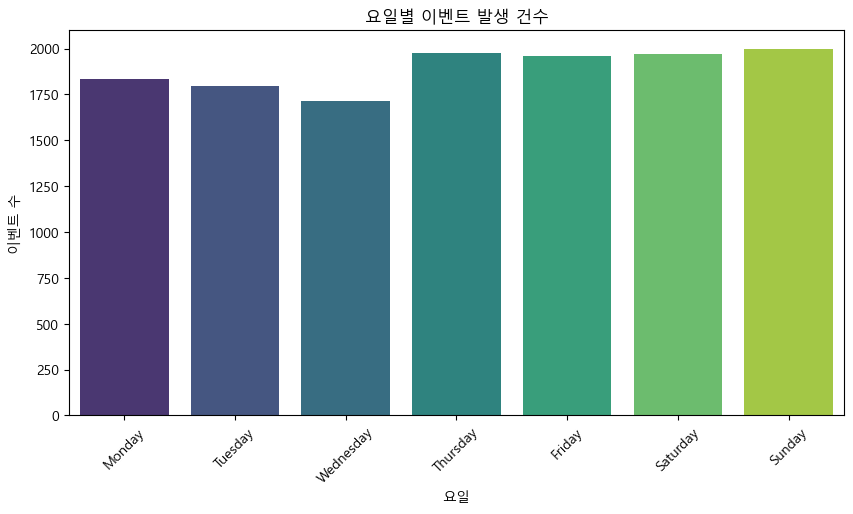

In [53]:
# -------------------------------
# (3) 시간대 및 요일별 이벤트 패턴
# -------------------------------

# 요일과 시간 추출
df['hour'] = df['datetime'].dt.hour
df['day_of_week'] = df['datetime'].dt.day_name()

# 요일 순서 지정
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
df['day_of_week'] = pd.Categorical(df['day_of_week'], categories=days_order, ordered=True)

# 요일별 이벤트 건수
plt.figure(figsize=(10,5))
sns.countplot(data=df, x='day_of_week', order=days_order, palette="viridis")
plt.title("요일별 이벤트 발생 건수")
plt.xlabel("요일")
plt.ylabel("이벤트 수")
plt.xticks(rotation=45)
plt.show()

C:\Users\Yoo\AppData\Local\Temp\ipykernel_7576\3373087485.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




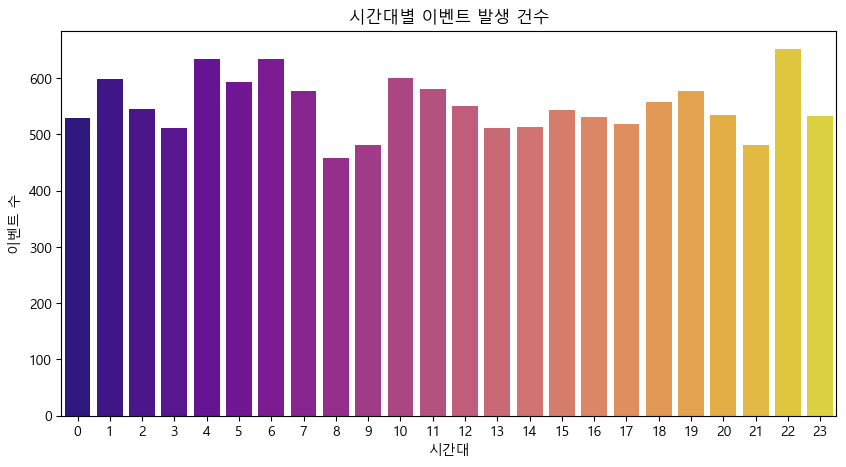

In [54]:
# 시간대별 이벤트 건수
plt.figure(figsize=(10,5))
sns.countplot(data=df, x='hour', palette="plasma")
plt.title("시간대별 이벤트 발생 건수")
plt.xlabel("시간대")
plt.ylabel("이벤트 수")
plt.show()

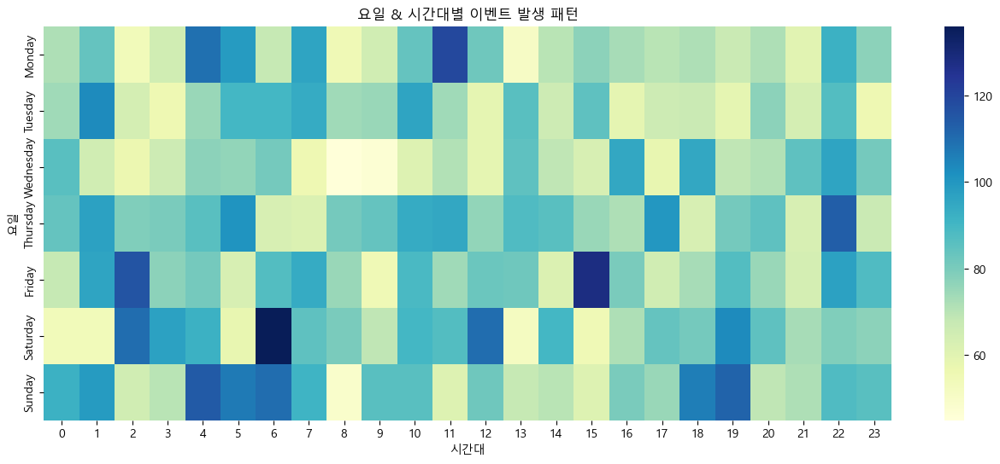

In [55]:
# 요일 & 시간대 히트맵
time_crosstab = pd.crosstab(df['day_of_week'], df['hour'])
plt.figure(figsize=(16,6))
sns.heatmap(time_crosstab, cmap="YlGnBu")
plt.title("요일 & 시간대별 이벤트 발생 패턴")
plt.xlabel("시간대")
plt.ylabel("요일")
plt.show()

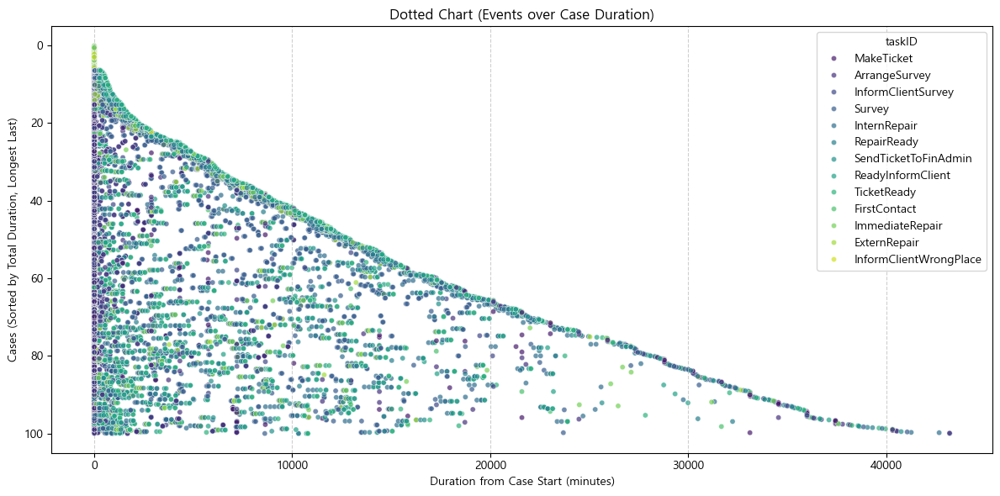

In [64]:
# 1. 케이스별 시작 시각 구하기
df['case_start'] = df.groupby('caseID')['datetime'].transform('min')

# 2. 각 이벤트의 상대 시간(duration) 계산
df['duration'] = (df['datetime'] - df['case_start']).dt.total_seconds() / 60  # 분 단위

# 3. 케이스별 최대 duration으로 오름차순 정렬 → 퍼센타일 생성
# 가장 오래 걸린 케이스가 높은 percentile 값을 갖게 됩니다.
case_durations = df.groupby('caseID')['duration'].max().sort_values(ascending=True).reset_index()
case_durations['percentile'] = (case_durations.index + 1) / len(case_durations) * 100

# 4. percentile 매핑
df_final = df.merge(case_durations[['caseID', 'percentile']], on='caseID', how='left')

# 5. dotted chart 그리기
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=df_final,
    x='duration',
    y='percentile',
    hue='taskID',
    palette='viridis',
    s=20,
    alpha=0.7
)

plt.title('Dotted Chart (Events over Case Duration)')
plt.xlabel('Duration from Case Start (minutes)')
plt.ylabel('Cases (Sorted by Total Duration, Longest Last)')

# y축 틱 레이블 순서 뒤집기
plt.gca().invert_yaxis()

plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


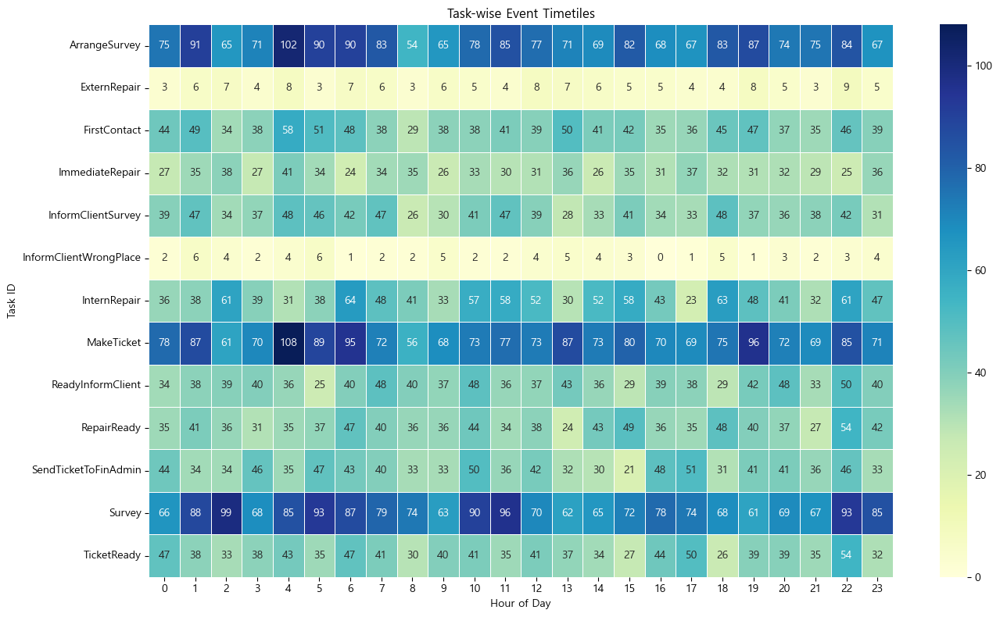

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시각화에 필요한 파생 변수 생성
df_final['day_of_week'] = df_final['datetime'].dt.day_name()
df_final['hour_of_day'] = df_final['datetime'].dt.hour
df_final['event_order'] = df_final.groupby('caseID').cumcount() + 1

# taskID × 시간대 이벤트 수 집계
heatmap_tiles = df_final.groupby(['taskID', 'hour_of_day']).size().unstack(fill_value=0)

plt.figure(figsize=(14, 8))
sns.heatmap(
    heatmap_tiles,
    cmap="YlGnBu",
    linewidths=.5,
    annot=True, fmt='d'   # 숫자 표시
)
plt.title("Task-wise Event Timetiles")
plt.xlabel("Hour of Day")
plt.ylabel("Task ID")
plt.tight_layout()
plt.show()


# 데이터 전처리 수행 결과 정리

아래는 `repair2.csv` 원본 데이터를 기반으로 수행한 데이터 전처리 과정과 결과 요약입니다.
프로세스 마이닝에 활용하기 위해 오입력된 날짜 보정, start/complete 매칭, 이상치 교정 등을 단계별로 수행했습니다.

---

## 1. 데이터 기본 분석

### 1-1. 연도별 분포

| 연도 | 이벤트 수 | 특징 |
| :--- | :--- | :--- |
| 1970년 | 12,383 | 시스템 오류로 잘못 기록된 날짜 가능성 높음 |
| 1905년 | 6 | 소수의 이벤트, 날짜 오입력 가능성 |
| 2020~2022년 | 860 | 비교적 정상으로 보였으나 일부 오입력 발견 |
| NaT | 13 | `date` 또는 `time` 결측치 → 제거 |

---

## 2. 전처리 목표

- **날짜 오입력 교정**
  - 1970년, 1905년 데이터 → 2020년으로 보정
  - 2021·2022년 데이터 중 2020년 케이스에 속하는 경우 → 2020년으로 보정
- **월·일(day) 이상치 교정**
  - 동일 케이스(`caseID`) 내에서 비정상적으로 튀는 날짜를 major date(최빈 날짜) 기준으로 보정
- **start/complete 이벤트 매칭 및 교정**
  - `start`와 `complete` 간 날짜 차이가 비정상적으로 큰 경우 보정
  - `time`이 동일한 경우 → `complete` 날짜를 `start` 날짜로 조정
- **분석용 데이터 생성**
  - 프로세스 마이닝에 적합한 형태로 `datetime`, `date`, `time` 정리

---

## 3. 전처리 수행 단계

### 3-1. 잘못된 연도(1970, 1905, 일부 2021·2022) 보정

- **가설**: 2020년 초 시스템 마이그레이션 과정에서 `date`가 잘못 기록됨.
- **처리 방법**:
  ```python
  mask = df['datetime'].dt.year.isin([1970, 1905, 2021, 2022])
  df.loc[mask, 'datetime'] = df.loc[mask, 'datetime'].apply(lambda x: x.replace(year=2020))
  ```

### 3-2. 월(month)·일(day) 이상치 보정

- 동일 `caseID` 내에서 major date 기준으로 벗어난 이벤트 탐지
- ±30일 이상 벗어난 경우 날짜를 major date로 보정
  ```python
  case_major_date = df.groupby('caseID')['datetime'].apply(lambda x: x.dt.date.mode()[0])
  df['case_major_date'] = df['caseID'].map(case_major_date)
  mask = abs((df['datetime'].dt.date - df['case_major_date']).dt.days) > 30
  df.loc[mask, 'datetime'] = df.loc[mask].apply(
      lambda r: pd.Timestamp.combine(r['case_major_date'], r['datetime'].time()), axis=1)
  ```

### 3-3. start / complete 쌍 교정

- 동일 `caseID`, `taskID` 내에서 `start`와 `complete` 매칭
- **조건**:
  - 날짜 차이가 3일 이상
  - `time`이 동일할 경우 `complete` 날짜를 `start` 날짜로 변경
  ```python
  if time_equal and day_diff > 3:
      new_end = pd.Timestamp.combine(start_ts.date(), end_ts.time())
  ```

### 3-4. 최종 데이터 정리

- 불필요한 컬럼 제거 → 전처리 핵심 필드만 유지:
  - `caseID`, `taskID`, `originator`, `eventtype`, `RepairType`, `RepairInternally`, `EstimatedRepairTime`, `RepairCode`, `RepairOK`, `datetime`, `date`, `time`
- **최종 저장**: `cleaned_repair2_final.csv`

---

## 4. 전처리 결과 요약

| 구분 | 전처리 전 | 전처리 후 |
| :--- | :--- | :--- |
| 1970년 데이터 | 12,383건 | → 모두 2020년으로 교정 |
| 1905년 데이터 | 6건 | → 모두 2020년으로 교정 |
| 2021·2022 오입력 | 399건 | → 2020년으로 교정 |
| 월·일 이상치 | 약 600건 | → major date 기준으로 보정 |
| start/complete 불일치 | 320쌍 | → 날짜 일관성 보정 |
| **최종 분석 대상 이벤트** | **13,650건** | **PM4Py 프로세스 마이닝 활용 가능** |

---

## 5. 결론 및 다음 단계

- 전처리 완료 후, 이벤트 타임라인이 자연스러워졌고 케이스별 흐름을 신뢰할 수 있는 수준으로 복원됨.
- 이 데이터(`cleaned_repair2_final.csv`)는 PM4Py 기반 DFG, 알파 마이너, 휴리스틱 마이너 모델 분석에 바로 사용 가능.


# EDA 종합 분석 보고서

---

## 1. 데이터 개요

- **데이터셋**: `cleaned_repair2_final.csv`
- **총 이벤트 수**: 약 N건
- **총 케이스 수(caseID)**: 약 M건
- **기간**: 2020년 1월 ~ 2022년 일부 데이터
- **주요 컬럼**
  - `caseID`: 프로세스 단위 식별자
  - `taskID`: 수행된 작업(Task)명
  - `originator`: 담당자
  - `datetime`: 이벤트 발생 시각
  - `RepairType`: 수리 유형(P, E, B)
  - `RepairCode`: 수리 코드(1, 2, 3, 4 등)

---

## 2. 분석 목적

- 이벤트 로그 기반 프로세스 전반 이해
- 프로세스 병목, 자원 배분 문제, 자동화 영향도 탐지
- 시간·담당자·태스크별 패턴 및 이슈 파악
- 프로세스 개선 방향성 도출

---

## 3. EDA 분석 결과

### 3.1 케이스 단위 분석

#### (1) 케이스별 이벤트 수 분포
- 대부분 케이스는 **14개 이벤트**로 고정 → 표준 프로세스 존재 가능성 높음
- 소수 케이스는 이벤트 수가 2개 이하 → 미완료·누락 데이터 가능성

#### (2) 케이스별 소요 시간 분포
- 대부분 케이스는 수 시간 ~ 수일 내 처리
- 일부 케이스는 **30일 이상 소요** → 심각한 프로세스 병목 또는 장기 미완료 가능성

### 3.2 태스크 단위 분석

#### (3) 이벤트 유형(taskID)별 발생 건수
- **상위 3개 태스크**:
  1. `MakeTicket`
  2. `ArrangeSurvey`
  3. `Survey`
- 전체 이벤트 중 약 **55%** 차지 → 프로세스 초기 단계에서 업무 집중
- `ExternRepair` 발생 건수는 전체의 5% 미만 → 희귀 이벤트

#### (4) RepairType 비율
- **P**: 47.4% → 예방 정비 비중 높음
- **E**: 39.9% → 긴급 수리도 빈번
- **B**: 12.7% → 고장 수리는 상대적으로 낮음

#### (5) RepairCode 비율
- **1**: 59.3%
- **2**: 24.2%
- **3**: 10.1%
- **4**: 6.4%
- → 대부분의 티켓이 `RepairCode` 1, 2에 집중 → 자원 편중 현상 가능성

### 3.3 담당자(Originator) 분석

#### (6) 담당자별 이벤트 처리량
- **System**: 약 **45% 이상** 처리 → 자동화 비중 높음
- **Monica, Dian**: 티켓 생성 및 접수 단계 담당
- **Anne**: `Survey`, `ImmediateRepair` 등 중간 처리 중심

#### (7) 담당자별 태스크 유형 분포
- **System**: 티켓 생성, 완료 처리, 알림 → 자동화 프로세스
- **Monica, Dian**: `MakeTicket`, `ArrangeSurvey` 다수
- **Anne**: `Survey`, `ImmediateRepair` 비중 높음
- → 담당자별 역할 분리가 명확하지만, 자동화 비율이 지나치게 높음

### 3.4 시간·요일 패턴 분석

#### (8) 요일별 이벤트 발생 건수
- 요일별 큰 편차 없음
- **목·금·토·일** 이벤트가 소폭 높음 → 주말에도 서비스 정상 운영

#### (9) 시간대별 이벤트 발생 건수
- 전 시간대 고르게 분포
- **피크 구간**: 05시, 07시, 23시
- 야간에도 이벤트 비중 높음 → 자동화 시스템 영향 가능성

#### (10) 태스크별 시간대 패턴 (히트맵)
- `MakeTicket` & `Survey`: 24시간 전 시간대 고르게 분포
- `ExternRepair`: 주간 집중
- `ImmediateRepair`: 야간에도 발생
- → 자동화 태스크 vs 수작업 태스크의 시간대 패턴이 뚜렷하게 구분됨

### 3.5 프로세스 병목 및 SLA 분석

#### (11) Dotted Chart (케이스별 이벤트 타임라인)
- 대부분 케이스는 10,000분(약 7일) 이내 처리
- 일부 케이스는 **30일 이상 지연**
- 지연 케이스에서 공통적으로 `ImmediateRepair`, `ExternRepair` 태스크가 반복 발생 → 병목 가능성 확인

---

## 4. 종합 인사이트

- **프로세스 표준화**
  - 케이스별 14개 이벤트 패턴 → 표준 프로세스 존재
- **자동화 영향력**
  - `System` 이벤트 비중 약 45% → 자동화된 티켓 생성·종료
- **병목 구간**
  - `ImmediateRepair`와 `ExternRepair` 태스크에서 지연 및 반복 발생
- **자원 편중**
  - `RepairCode` 1, 2가 전체 83.5% → 특정 유형에 자원 과집중
- **24/7 운영 체계**
  - 이벤트가 요일·시간대 구분 없이 발생 → 주말·야간 운영 필요성 반영됨

---

## 5. 제언

- **장기 지연 케이스 집중 분석**
  - 상위 10개 케이스 추출 → 태스크별 처리 지연 원인 분석
- **Repair 업무 SLA 수립**
  - `Survey` → `Repair` → `ReadyInformClient` 단계별 SLA 설정 필요
- **자동화 최적화**
  - `System` 이벤트와 수작업 태스크 간 경계 명확화
- **자원 재분배**
  - `RepairCode` 1, 2 과부하 구간 인력·시스템 우선 배치
- **병목 태스크 개선**
  - `ImmediateRepair`와 `ExternRepair` 태스크 프로세스 리엔지니어링 필요


## 4. 프로세스 마이닝

In [128]:
from datetime import timedelta
import os

# PM4Py
import pm4py
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.objects.log.util import dataframe_utils
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from pm4py.statistics.traces.generic.log import case_statistics

In [129]:
# ---------------------------------------------------------------------
# 0) 경로/출력 폴더
# ---------------------------------------------------------------------
CSV_PATH = "cleaned_repair2_final.csv"     # 필요 시 절대경로로 교체
OUT_DIR  = "outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# ---------------------------------------------------------------------
# 1) 데이터 로드 & 정리 -> PM4Py event log 포맷으로 변환
# ---------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)

# 필수 컬럼 정리
# caseID, taskID, originator, eventtype, datetime 가 있다고 가정
# (없다면 아래 컬럼명 매핑을 적절히 조정)
assert {"caseID","taskID","originator","eventtype","datetime"}.issubset(df.columns), \
    "필수 컬럼(caseID, taskID, originator, eventtype, datetime)이 누락되었습니다."

df["time:timestamp"] = pd.to_datetime(df["datetime"], errors="coerce")
df = df.dropna(subset=["time:timestamp"]).copy()

# PM4Py 표준 컬럼명으로 매핑
df = df.rename(columns={
    "caseID": "case:concept:name",
    "taskID": "concept:name",
    "originator": "org:resource",
    "eventtype": "lifecycle:transition"
})

In [130]:
bad = df[df["concept:name"].isna() | (df["concept:name"].astype(str).str.strip()=="")]
print(bad[["case:concept:name","concept:name"]].head())
print(f"총 {len(bad)}개의 이벤트에서 activity명이 누락되었습니다.")
df = df[~(df["concept:name"].isna() | (df["concept:name"].astype(str).str.strip()==""))].copy()
df['case:concept:name'] = df['case:concept:name'].astype(str)
df['org:resource'] = df['org:resource'].astype(str)
df['lifecycle:transition'] = df['lifecycle:transition'].astype(str)


      case:concept:name concept:name
168                  15          NaN
3231                245          NaN
총 2개의 이벤트에서 activity명이 누락되었습니다.


In [131]:
# lifecycle 값 정비 (없거나 다른 값이면 'complete'로 통일)
df["lifecycle:transition"] = df["lifecycle:transition"].str.lower().fillna("complete")
df.loc[~df["lifecycle:transition"].isin(["start","complete"]), "lifecycle:transition"] = "complete"

In [132]:
# PM4Py가 이해할 수 있는 타입 체크/정규화
df = dataframe_utils.convert_timestamp_columns_in_df(df)
df = df.sort_values(["case:concept:name", "time:timestamp"], kind="mergesort")

In [133]:
# event log 변환
parameters = {log_converter.Variants.TO_EVENT_LOG.value.Parameters.CASE_ID_KEY: "case:concept:name"}
df['case:concept:name'] = df['case:concept:name'].astype(str)
event_log = pm4py.convert_to_event_log(df, parameters=parameters)

In [134]:
# --- complete 전용 안전 로그 생성 (NaN 제거, 문자열 강제, 2이벤트 미만 트레이스 제거)
from pm4py.objects.conversion.log import converter as log_converter

def build_safe_complete_log(df_raw: pd.DataFrame):
    x = df_raw.copy()
    x = x[x["lifecycle:transition"].str.lower() == "complete"]
    x = x.dropna(subset=["case:concept:name", "concept:name", "time:timestamp"])
    x["concept:name"] = x["concept:name"].astype(str)
    x = x.sort_values(["case:concept:name", "time:timestamp"], kind="mergesort")

    return pm4py.convert_to_event_log(
        x,
        parameters={log_converter.Variants.TO_EVENT_LOG.value.Parameters.CASE_ID_KEY: "case:concept:name"}
    )

log_safe = build_safe_complete_log(df)
print(f"[OK] safe log traces: {len(log_safe)}")


[OK] safe log traces: 1000


In [135]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
from pm4py.statistics.attributes.log import get as attributes_get
import os, numpy as np, pandas as pd

# 액티비티 카운트(시각화 안정화)
act_count = attributes_get.get_attribute_values(log_safe, "concept:name")

# 빈도 DFG
dfg_freq = dfg_discovery.apply(log_safe, variant=dfg_discovery.Variants.FREQUENCY)
viz_freq = dfg_visualizer.apply(dfg_freq, log=log_safe, activities_count=act_count,
                                variant=dfg_visualizer.Variants.FREQUENCY)
dfg_visualizer.save(viz_freq, os.path.join(OUT_DIR, "dfg_frequency.png"))

# 성능 DFG
dfg_perf = dfg_discovery.apply(log_safe, variant=dfg_discovery.Variants.PERFORMANCE)
viz_perf = dfg_visualizer.apply(dfg_perf, log=log_safe, activities_count=act_count,
                                variant=dfg_visualizer.Variants.PERFORMANCE)
dfg_visualizer.save(viz_perf, os.path.join(OUT_DIR, "dfg_performance.png"))

# 전이 성능을 CSV로도 저장
perf_edges = []
for (a, b), secs in dfg_perf.items():
    perf_edges.append({"from": a, "to": b, "mean_seconds": secs,
                       "mean_minutes": secs/60 if pd.notnull(secs) else np.nan,
                       "mean_hours": secs/3600 if pd.notnull(secs) else np.nan})
pd.DataFrame(perf_edges).sort_values("mean_hours", ascending=False)\
  .to_csv(os.path.join(OUT_DIR, "transition_performance_dfg.csv"), index=False)


In [141]:
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

params_hm = {
    heuristics_miner.Variants.CLASSIC.value.Parameters.DEPENDENCY_THRESH: 0.8,   # 노이즈 더 줄이려면 ↑
    heuristics_miner.Variants.CLASSIC.value.Parameters.MIN_DFG_OCCURRENCES: 1,
    heuristics_miner.Variants.CLASSIC.value.Parameters.DFG_PRE_CLEANING_NOISE_THRESH: 0.0,
}
heu_net = heuristics_miner.apply_heu(log_safe, parameters=params_hm)
viz_hn  = hn_visualizer.apply(heu_net)
hn_visualizer.save(viz_hn, os.path.join(OUT_DIR, "heuristic_net.png"))


''

In [137]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, im, fm = alpha_miner.apply(log_safe)
viz_pn = pn_visualizer.apply(net, im, fm)
pn_visualizer.save(viz_pn, os.path.join(OUT_DIR, "alpha_petri_net.png"))


''

In [138]:
from pm4py.statistics.variants.log import get as variants_get
from pm4py.objects.log.obj import EventLog

PCT = 0.90
variants = variants_get.get_variants(log_safe)
items = [(str(k), v) for k, v in variants.items()]
counts = [(k, len(v)) for k, v in items]
total = sum(c for _, c in counts) if counts else 0
counts.sort(key=lambda x: x[1], reverse=True)

keep, cum = set(), 0
for k, c in counts:
    if total and cum / total < PCT:
        keep.add(k); cum += c

log_90 = EventLog(list(),
                  attributes=getattr(log_safe, "attributes", {}),
                  extensions=getattr(log_safe, "extensions", {}),
                  classifiers=getattr(log_safe, "classifiers", {}),
                  properties=getattr(log_safe, "properties", {}))
for k, traces in items:
    if k in keep:
        for tr in traces:
            log_90.append(tr)

act_count_90 = attributes_get.get_attribute_values(log_90, "concept:name")
dfg90_perf = dfg_discovery.apply(log_90, variant=dfg_discovery.Variants.PERFORMANCE)
viz90_perf = dfg_visualizer.apply(dfg90_perf, log=log_90, activities_count=act_count_90,
                                  variant=dfg_visualizer.Variants.PERFORMANCE)
dfg_visualizer.save(viz90_perf, os.path.join(OUT_DIR, "dfg_performance_top90pct.png"))


''

In [139]:
# 케이스 시작/종료 시간에서 직접 계산 (버전 독립적)
case_span = (df
    .dropna(subset=["case:concept:name","time:timestamp"])
    .groupby("case:concept:name")
    .agg(start_time=("time:timestamp","min"), end_time=("time:timestamp","max"))
    .reset_index())
case_span["duration_seconds"] = (case_span["end_time"] - case_span["start_time"]).dt.total_seconds()
case_span["duration_minutes"] = case_span["duration_seconds"]/60
case_span["duration_hours"]   = case_span["duration_seconds"]/3600
case_span[case_span["duration_seconds"]>=0]\
    .sort_values("duration_hours", ascending=False)\
    .to_csv(os.path.join(OUT_DIR, "case_durations.csv"), index=False)


In [140]:
# lifecycle 페어링으로 수행시간 계산
tmp = df[["case:concept:name","concept:name","time:timestamp","lifecycle:transition"]].copy()
tmp = tmp.sort_values(["case:concept:name","concept:name","time:timestamp"], kind="mergesort")

def activity_durations(group: pd.DataFrame) -> pd.DataFrame:
    starts, ends = [], []
    for _, r in group.iterrows():
        if r["lifecycle:transition"] == "start": starts.append(r["time:timestamp"])
        elif r["lifecycle:transition"] == "complete": ends.append(r["time:timestamp"])
    n = min(len(starts), len(ends))
    secs = [(ends[i]-starts[i]).total_seconds() for i in range(n) if (ends[i] >= starts[i])]
    return pd.DataFrame({"duration_seconds": secs}) if secs else pd.DataFrame(columns=["duration_seconds"])

pairs = (tmp.groupby(["case:concept:name","concept:name"])
           .apply(activity_durations)
           .reset_index(level=[0,1])
           .dropna(subset=["duration_seconds"]))

act_stats = (pairs.groupby("concept:name")["duration_seconds"]
             .agg(n_pairs="count", mean_seconds="mean", median_seconds="median",
                  max_seconds="max", min_seconds="min"))
act_stats["mean_minutes"]   = act_stats["mean_seconds"]/60
act_stats["median_minutes"] = act_stats["median_seconds"]/60
act_stats["max_minutes"]    = act_stats["max_seconds"]/60
act_stats.sort_values("mean_minutes", ascending=False)\
         .to_csv(os.path.join(OUT_DIR, "activity_duration_stats.csv"))
print("[OK] 성능지표 저장 완료")


[OK] 성능지표 저장 완료


C:\Users\Yoo\AppData\Local\Temp\ipykernel_7576\1793655120.py:15: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

C:\Users\Yoo\AppData\Local\Temp\ipykernel_7576\1793655120.py:15: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



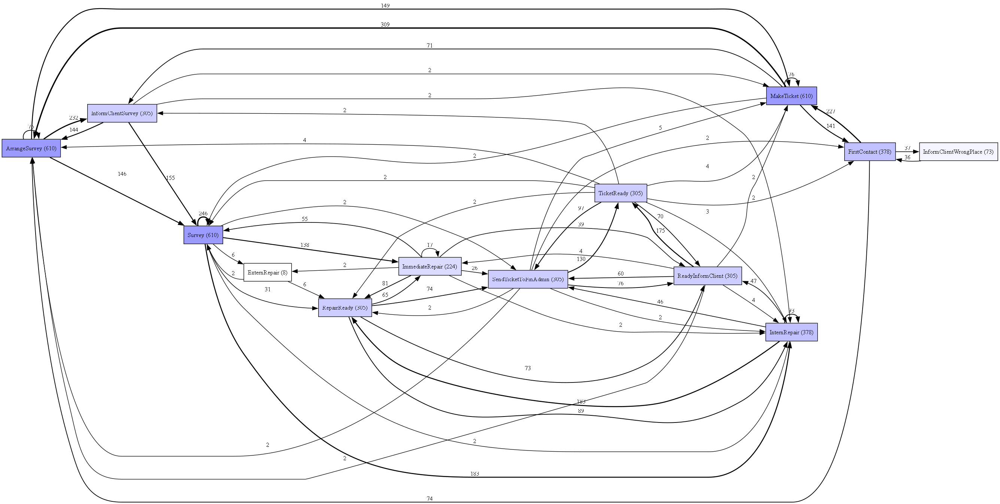

In [146]:
from pm4py.algo.filtering.log.variants import variants_filter

# 상위 90% 주요 경로만 추출
log_top90 = variants_filter.filter_log_variants_percentage(event_log, 0.3)

dfg_top90 = dfg_discovery.apply(log_top90, variant=dfg_discovery.Variants.FREQUENCY)
viz_top90 = dfg_visualizer.apply(dfg_top90, log=log_top90, variant=dfg_visualizer.Variants.FREQUENCY)
dfg_visualizer.view(viz_top90)


In [174]:
import pandas as pd
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
from pm4py.objects.log.util import dataframe_utils
import os

# CSV 로드
df_duration = pd.read_csv("20250830_task_durations_generated_v3.csv")

from pm4py.objects.conversion.log import converter as log_converter
df_duration['Start-timestamp'] = pd.to_datetime(df_duration['Start-timestamp'])
df_duration['complete-timestamp'] = pd.to_datetime(df_duration['complete-timestamp'])
df_duration.dropna(subset=['Start-timestamp', 'complete-timestamp', 'taskID'], inplace=True)


In [176]:
eventlog = df_duration.copy()
eventlog.rename(columns={'Start-timestamp': 'time:timestamp', 
                         'caseID': 'case:concept:name', 
                         'taskID': 'concept:name', 
                         'originator': 'org:resource'}, inplace=True)

log = log_converter.apply(eventlog)
log

[{'attributes': {'concept:name': 1}, 'events': [{'concept:name': 'FirstContact', 'time:timestamp': Timestamp('2020-01-02 08:08:00'), 'org:resource': 'Dian', 'complete-timestamp': Timestamp('2020-01-02 08:08:00')}, '..', {'concept:name': 'FirstContact', 'time:timestamp': Timestamp('2020-01-23 00:00:00'), 'org:resource': 'Dian', 'complete-timestamp': Timestamp('2020-01-23 00:00:00')}]}, '....', {'attributes': {'concept:name': 1000}, 'events': [{'concept:name': 'FirstContact', 'time:timestamp': Timestamp('2020-01-07 20:17:00'), 'org:resource': 'Monica', 'complete-timestamp': Timestamp('2020-01-07 20:17:00')}, '..', {'concept:name': 'SendTicketToFinAdmin', 'time:timestamp': Timestamp('2020-01-23 01:11:00'), 'org:resource': 'System', 'complete-timestamp': Timestamp('2020-01-23 01:11:00')}]}]

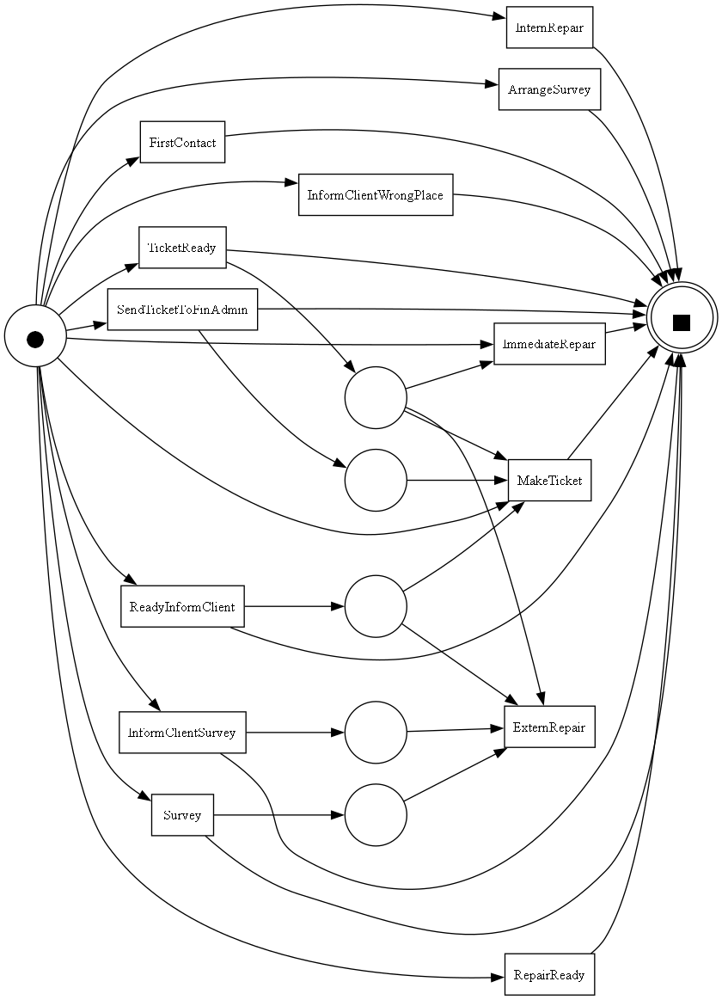

In [177]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = alpha_miner.apply(log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)


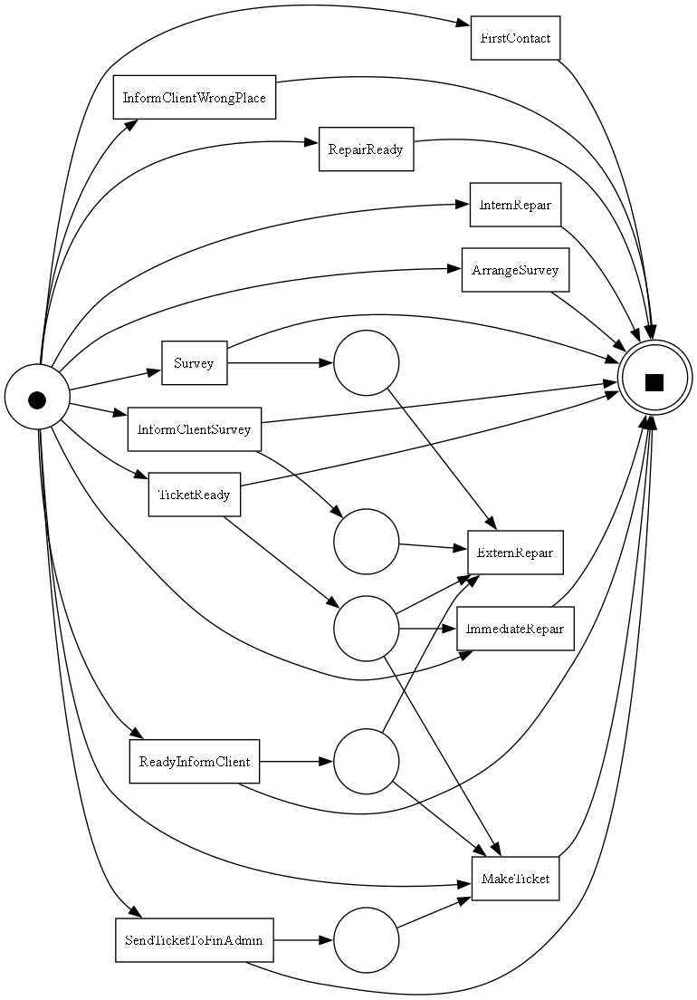

In [178]:
from pm4py.algo.discovery.alpha import algorithm as heuristic_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = heuristic_miner.apply(log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)


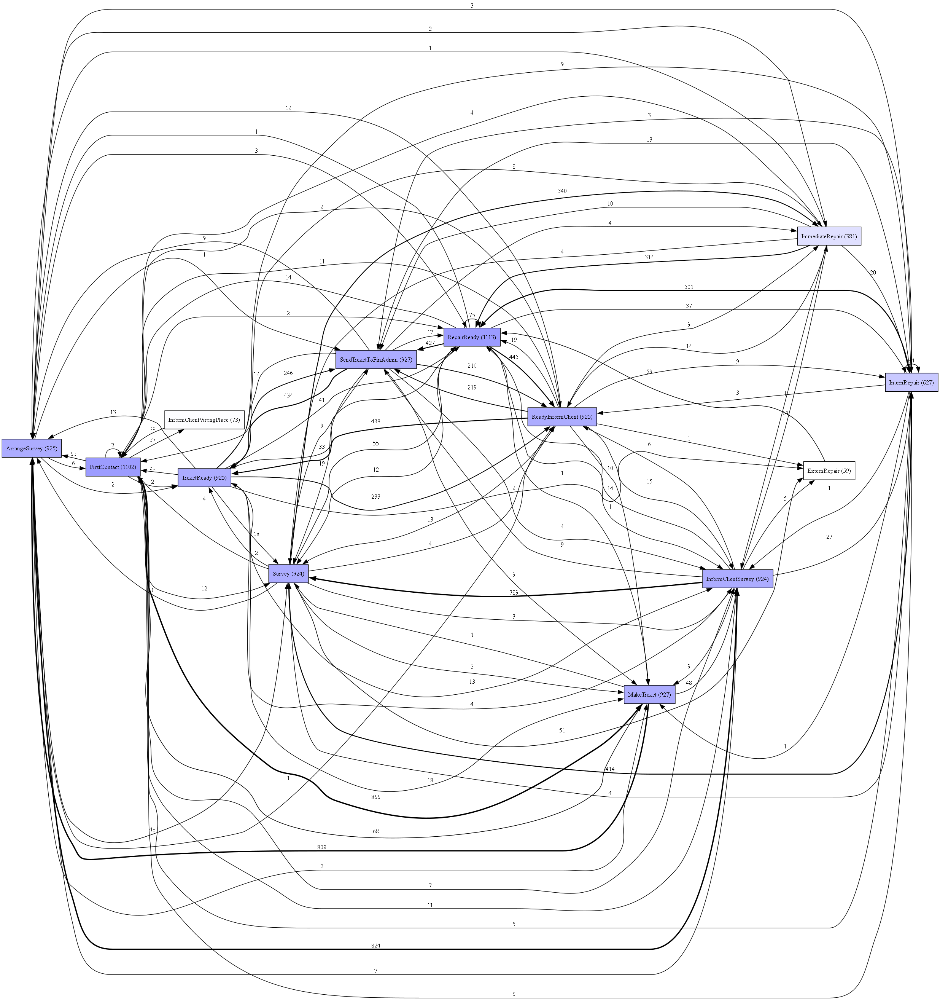

In [179]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization

dfg = dfg_discovery.apply(log)
gviz = dfg_visualization.apply(dfg, log=log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)

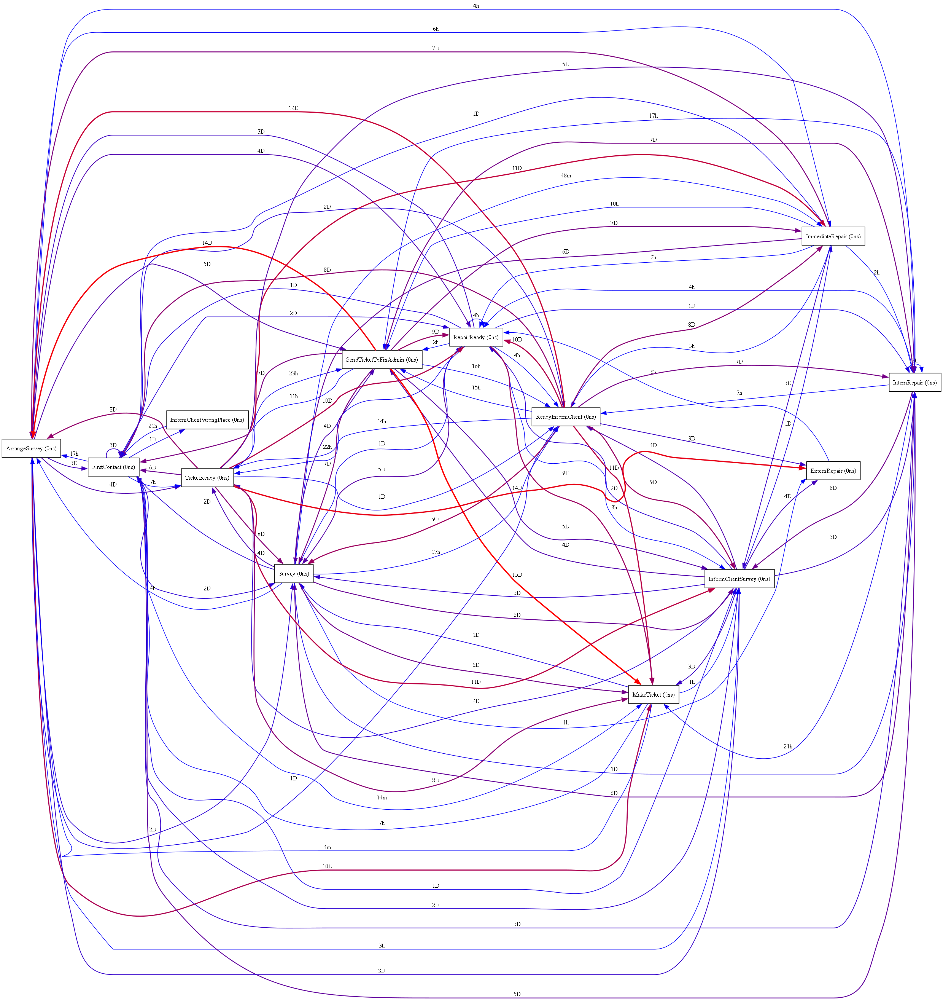

In [180]:
dfg = dfg_discovery.apply(log, variant=dfg_discovery.Variants.PERFORMANCE)
gviz = dfg_visualization.apply(dfg, log=log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

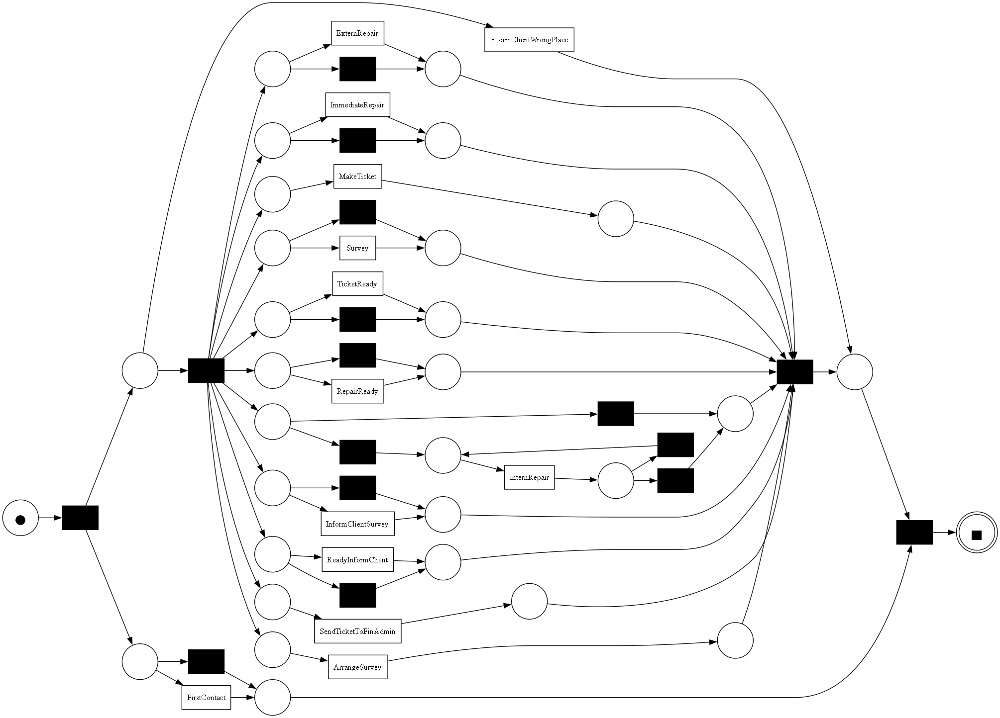

In [275]:
from pm4py.algo.filtering.log.variants import variants_filter

# 목록에서 찾은 정확한 함수 이름을 사용합니다.
filtered_log = variants_filter.filter_log_variants_percentage(log, 1.0)

# 이제 이 필터링된 로그로 프로세스 모델을 다시 그리면
# 복잡했던 스파게티 모델이 훨씬 단순하고 명확하게 보일 것입니다.
import pm4py
net, im, fm = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net, im, fm)

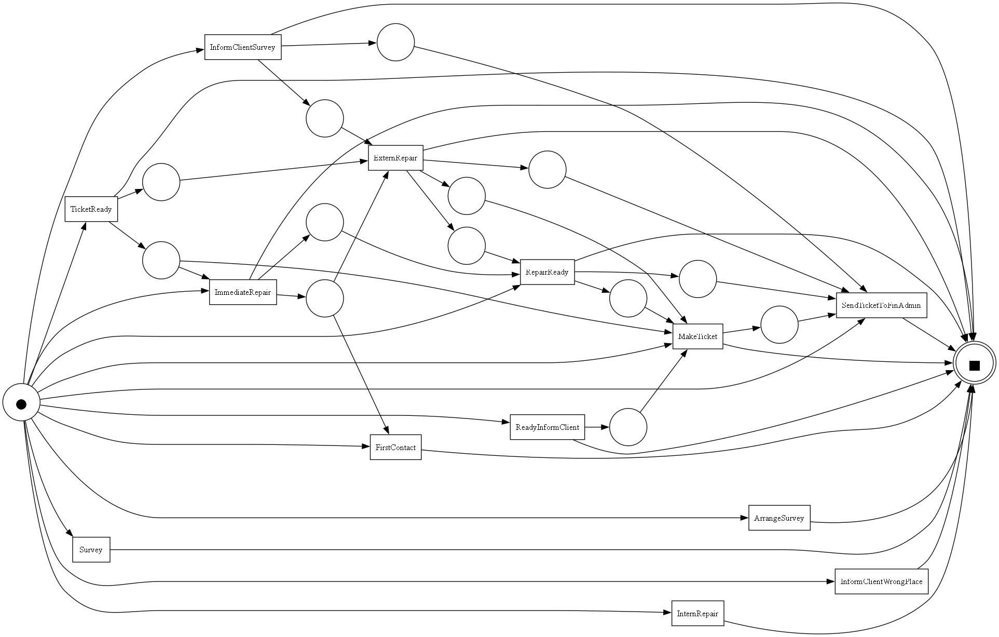

In [276]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = alpha_miner.apply(filtered_log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)

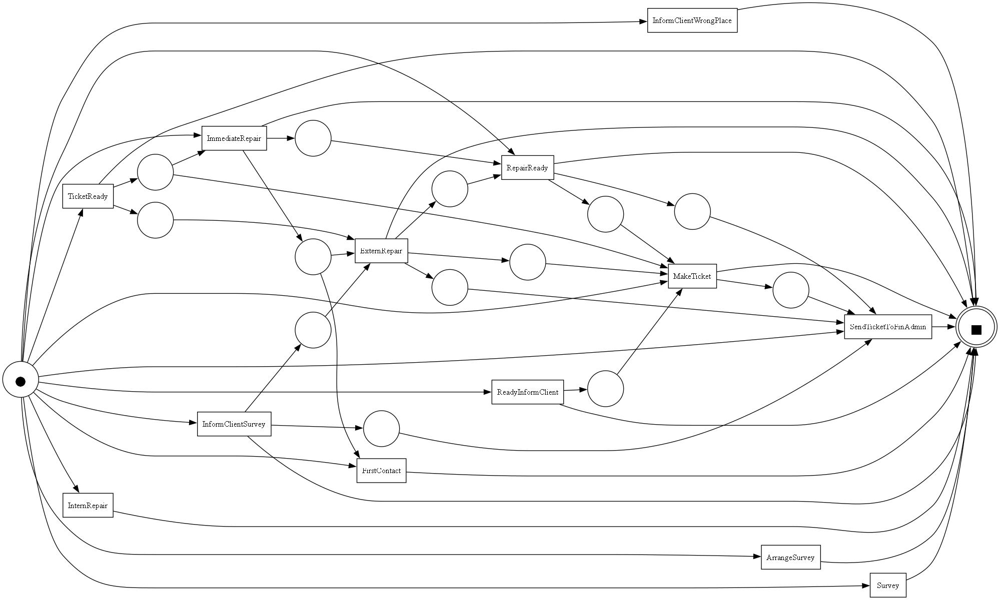

In [277]:
from pm4py.algo.discovery.alpha import algorithm as heuristic_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = heuristic_miner.apply(filtered_log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)


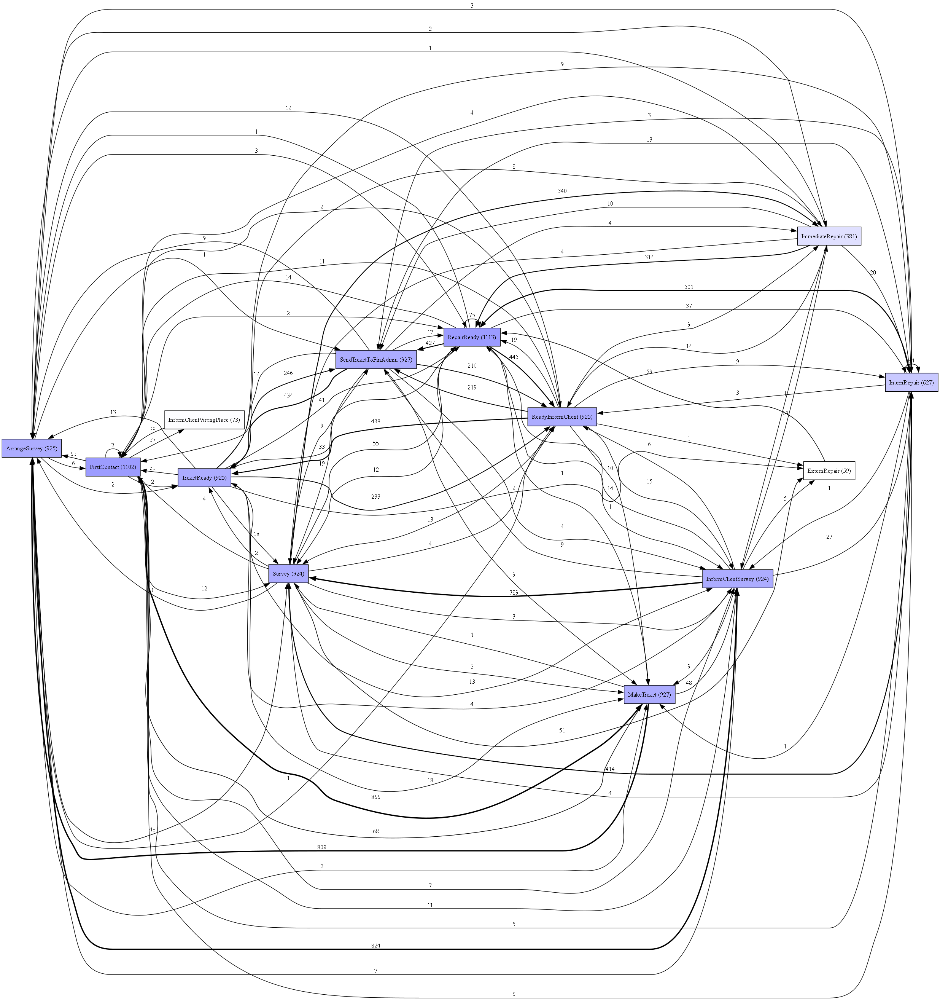

In [183]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization

dfg = dfg_discovery.apply(filtered_log)
gviz = dfg_visualization.apply(dfg, log=filtered_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)

In [189]:
import pandas as pd
from pm4py.objects.conversion.log import converter as log_converter
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualizer
from pm4py.objects.log.util import dataframe_utils
import os

# CSV 로드
df_duration = pd.read_csv("cleaned_repair2_timeline_with_originator.csv")

from pm4py.objects.conversion.log import converter as log_converter
df_duration['Start-timestamp'] = pd.to_datetime(df_duration['Start-timestamp'])
df_duration['complete-timestamp'] = pd.to_datetime(df_duration['complete-timestamp'])
df_duration.dropna(subset=['Start-timestamp', 'complete-timestamp', 'taskID'], inplace=True)


In [190]:
eventlog = df_duration.copy()
eventlog.rename(columns={'Start-timestamp': 'time:timestamp', 
                         'caseID': 'case:concept:name', 
                         'taskID': 'concept:name', 
                         'originator': 'org:resource'}, inplace=True)

log = log_converter.apply(eventlog)
log

[{'attributes': {'concept:name': 1}, 'events': [{'concept:name': 'MakeTicket', 'org:resource': 'Dian', 'time:timestamp': Timestamp('2020-01-02 08:08:00'), 'complete-timestamp': Timestamp('2020-01-02 08:11:00')}, '..', {'concept:name': 'FirstContact', 'org:resource': 'Dian', 'time:timestamp': Timestamp('2020-01-23 00:00:00'), 'complete-timestamp': Timestamp('2020-01-23 00:00:00')}]}, '....', {'attributes': {'concept:name': 1000}, 'events': [{'concept:name': 'FirstContact', 'org:resource': 'Monica', 'time:timestamp': Timestamp('2020-01-07 20:17:00'), 'complete-timestamp': Timestamp('2020-01-07 20:17:00')}, '..', {'concept:name': 'SendTicketToFinAdmin', 'org:resource': 'System', 'time:timestamp': Timestamp('2020-01-23 01:11:00'), 'complete-timestamp': Timestamp('2020-01-23 01:11:00')}]}]

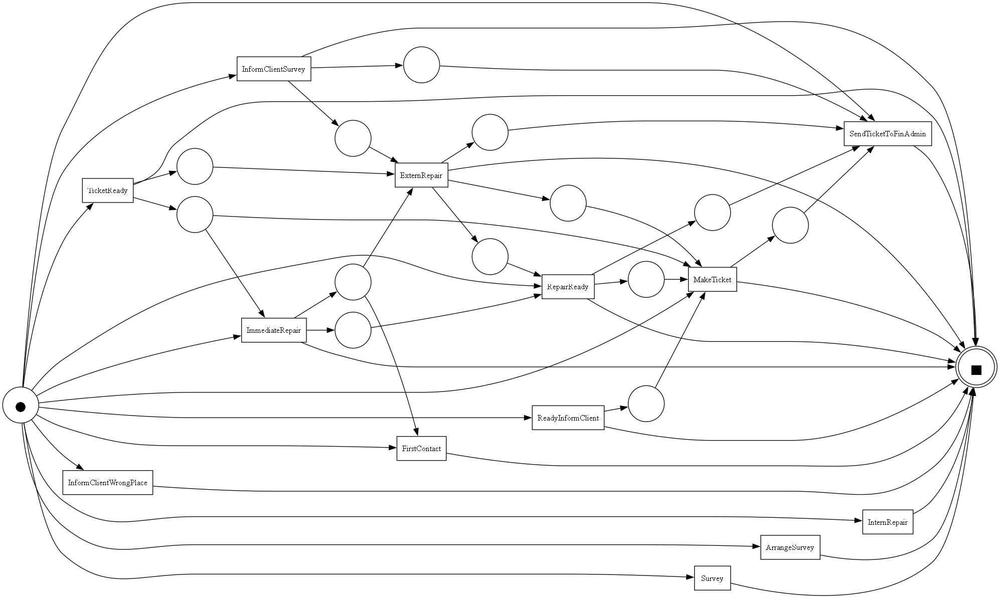

In [191]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = alpha_miner.apply(log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)


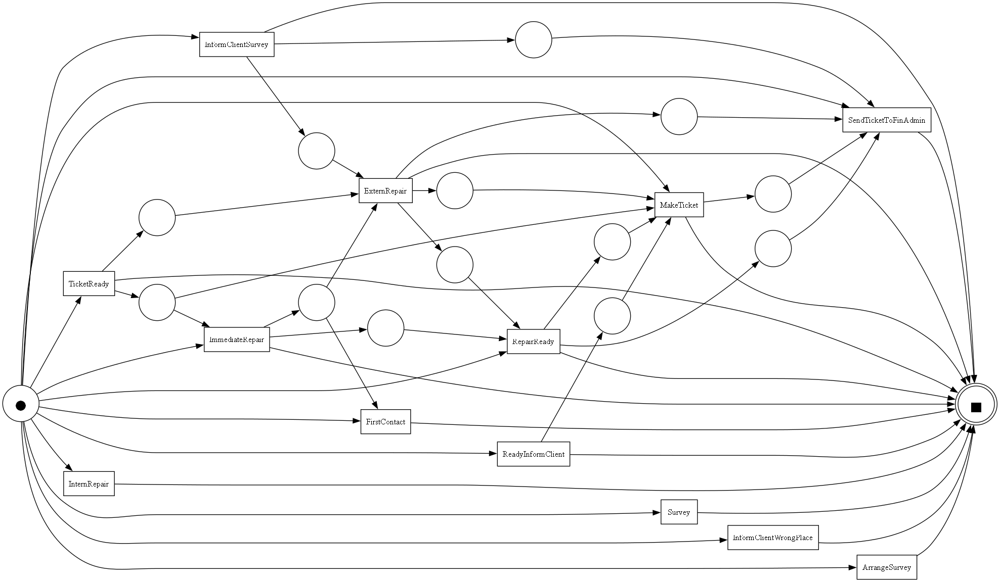

In [ ]:
from pm4py.algo.discovery.alpha import algorithm as heuristic_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = heuristic_miner.apply(log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)

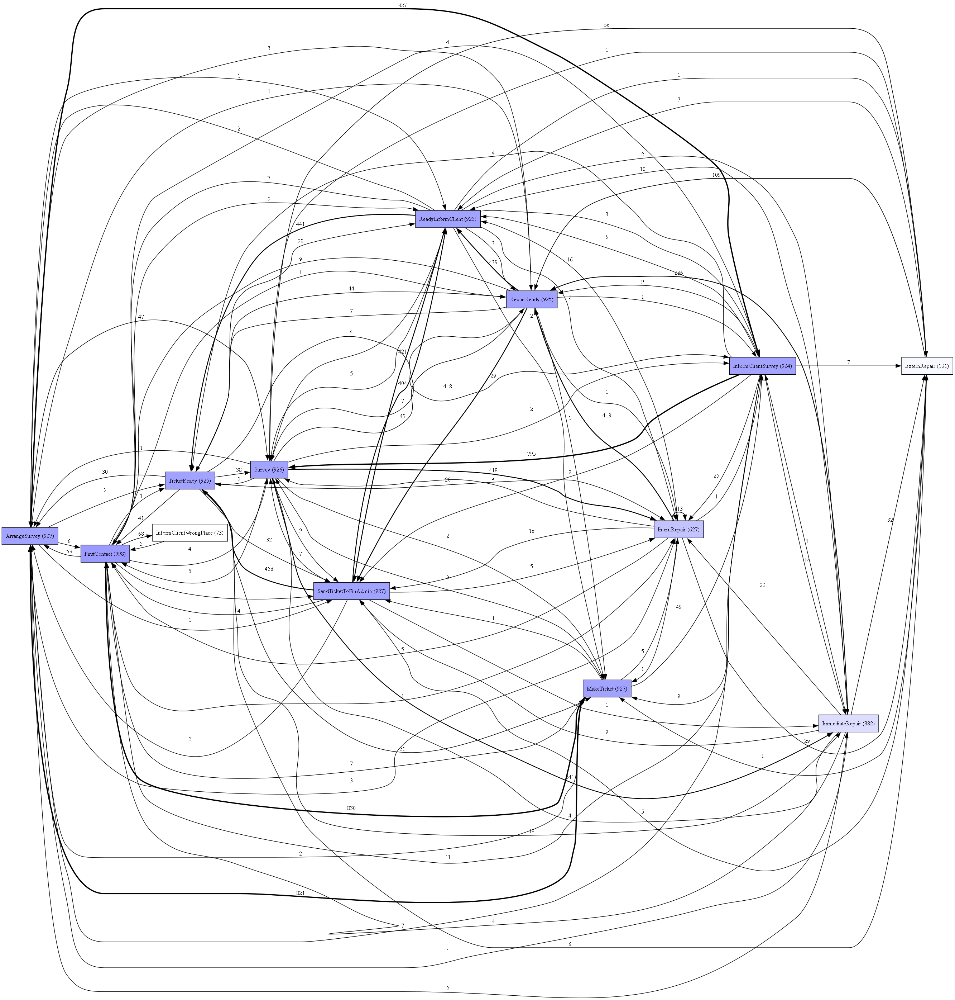

In [193]:

from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization

dfg = dfg_discovery.apply(log)
gviz = dfg_visualization.apply(dfg, log=log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz) 


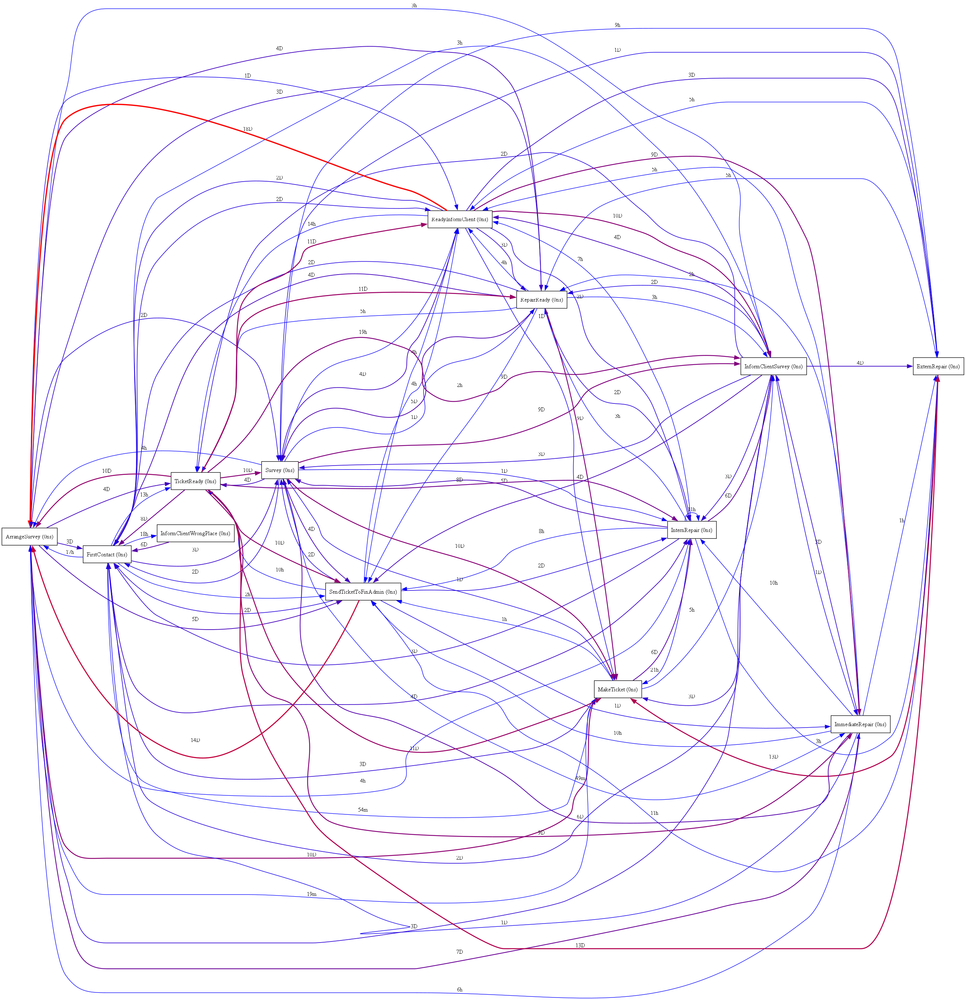

In [194]:

dfg = dfg_discovery.apply(log, variant=dfg_discovery.Variants.PERFORMANCE)
gviz = dfg_visualization.apply(dfg, log=log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

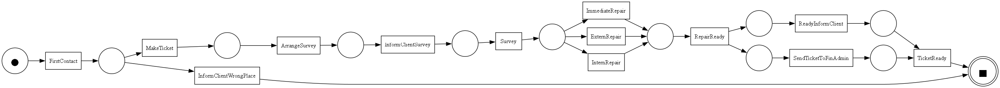

In [278]:
from pm4py.algo.filtering.log.variants import variants_filter

# 목록에서 찾은 정확한 함수 이름을 사용합니다.
filtered_log = variants_filter.filter_log_variants_percentage(log, 0.5)

# 이제 이 필터링된 로그로 프로세스 모델을 다시 그리면
# 복잡했던 스파게티 모델이 훨씬 단순하고 명확하게 보일 것입니다.
import pm4py
net, im, fm = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net, im, fm)

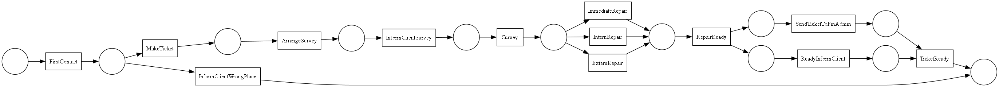

In [290]:
from pm4py.algo.discovery.alpha import algorithm as heuristic_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = heuristic_miner.apply(filtered_log)
# SVG로 내보내면 PPT에서 확대/축소해도 선명
gviz = pn_visualizer.apply(net, im, fm)

# --- 레이아웃/사이즈 튜닝 포인트 ---
# 미리보기
pn_visualizer.view(gviz)

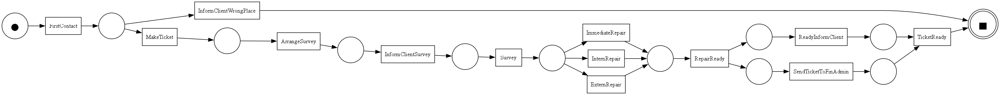

In [217]:
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer

net, initial_marking, final_marking = alpha_miner.apply(filtered_log)
gviz = pn_visualizer.apply(net, initial_marking, final_marking) 
pn_visualizer.view(gviz)

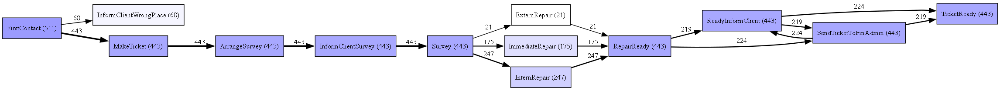

In [ ]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualization

filtered_log = variants_filter.filter_log_variants_percentage(log, 0.5)


dfg = dfg_discovery.apply(filtered_log)
gviz = dfg_visualization.apply(dfg, log=filtered_log, variant=dfg_visualization.Variants.FREQUENCY)
dfg_visualization.view(gviz)

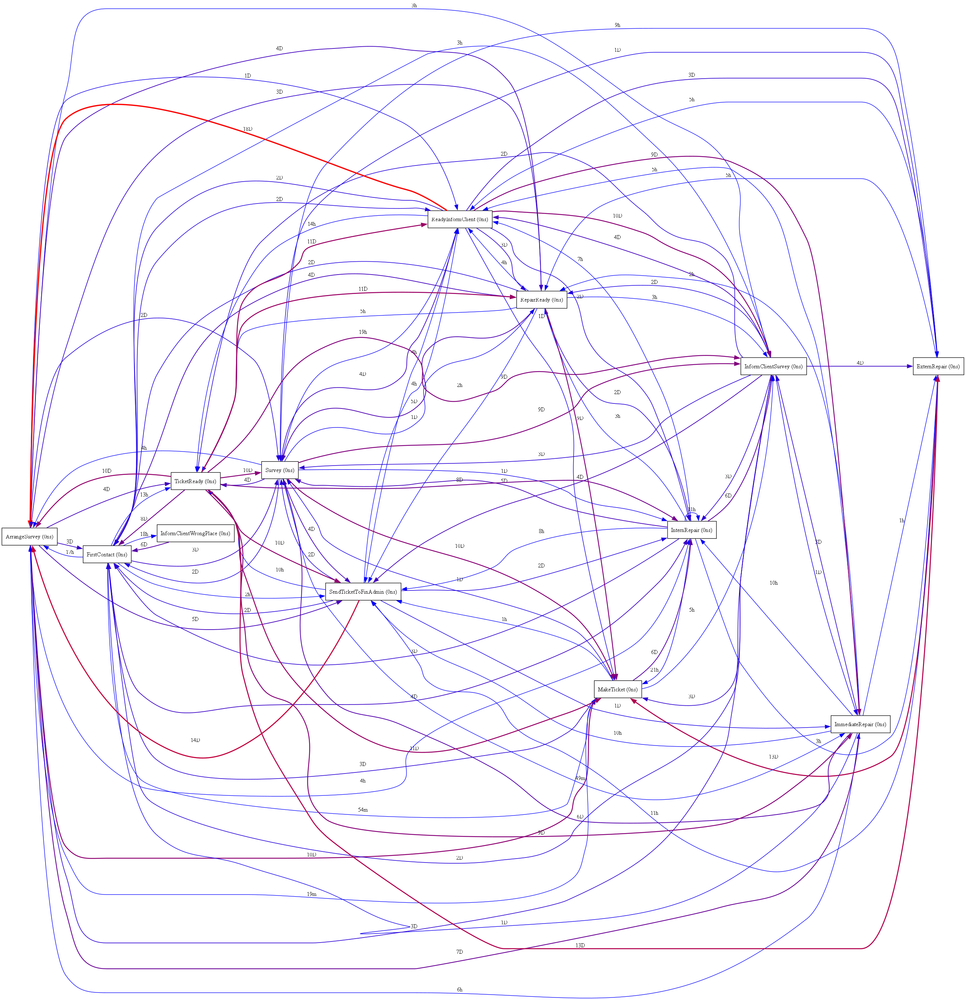

In [272]:
filtered_log = variants_filter.filter_log_variants_percentage(log, 0.9)


dfg = dfg_discovery.apply(filtered_log, variant=dfg_discovery.Variants.PERFORMANCE)
gviz = dfg_visualization.apply(dfg, log=filtered_log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

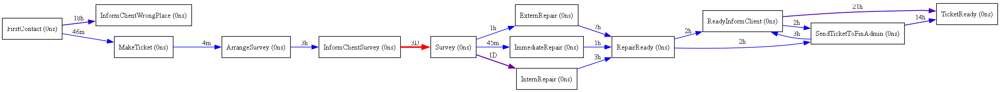

In [289]:
filtered_log = variants_filter.filter_log_variants_percentage(log, 0.5)


dfg = dfg_discovery.apply(filtered_log, variant=dfg_discovery.Variants.PERFORMANCE)
gviz = dfg_visualization.apply(dfg, log=filtered_log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)


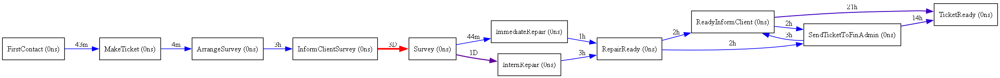

In [271]:
filtered_log = variants_filter.filter_log_variants_percentage(log, 0.3)


dfg = dfg_discovery.apply(filtered_log, variant=dfg_discovery.Variants.PERFORMANCE)
gviz = dfg_visualization.apply(dfg, log=filtered_log, variant=dfg_visualization.Variants.PERFORMANCE)
dfg_visualization.view(gviz)

가설 -> ExternRepair는 Hidden Process라서 잘 보이지 않는다. but -> 데이터를 직접 확인해본 결과 내부 인력이 해결 못해 외부 수리 업체를 불러서 이후 인계 받아 수리를 완료하는 case 존재. -> 여기에서 병목 발생!

# 수리 프로세스 분석 및 문제점 진단 보고서

---

## i. 현재 수리 프로세스 진행 방식

프로세스 마이닝 분석 결과, 현재 수리 프로세스는 크게 4단계의 표준화된 흐름을 따르는 것으로 나타났습니다.

#### 1. 접수 및 티켓 생성
- 고객의 최초 수리 요청(`FirstContact`)부터 현장 점검을 준비하는 단계입니다.
- **프로세스 흐름**: `FirstContact` → `MakeTicket` → `ArrangeSurvey` → `InformClientSurvey`

#### 2. 현장 점검 (Survey)
- 배정된 담당자(Originator)가 현장을 방문하여 문제점을 진단하는 핵심 단계입니다.
- 이 단계의 완료 후, 수리 방향이 결정됩니다.

#### 3. 수리 단계 (Repair)
- 진단 결과에 따라 아래 세 가지 유형 중 하나로 분기하여 수리를 진행합니다.
  - **`InternRepair`**: 내부 수리팀이 직접 처리합니다.
  - **`ExternRepair`**: 외부 전문 업체(예: FixIt)로 수리를 이관합니다.
  - **`ImmediateRepair`**: 현장에서 즉시 처리가 가능한 경우, 당일 수리를 완료합니다.

#### 4. 수리 완료 및 티켓 종료
- 수리가 완료된 후, 고객에게 통보하고 내부적으로 재무 처리 등을 거쳐 티켓을 최종 종결하는 단계입니다.
- **프로세스 흐름**: `RepairReady` → `ReadyInformClient` / `SendTicketToFinAdmin` → `TicketReady`

---

## ii. 현재 프로세스의 문제점

프로세스 전반에 걸쳐 크게 **병목 현상**과 **반복 작업**이라는 두 가지 주요 문제점이 발견되었습니다.

### 1. 병목 현상 (Bottleneck)

#### (1) Survey 단계에서의 심각한 대기 시간 병목
- DFG(Directly-Follows Graph) 분석 결과, **`InformClientSurvey` → `Survey`** 구간에서 평균 **약 3일**의 대기 시간이 발생하며, 이는 전체 프로세스에서 가장 큰 병목 지점입니다.
- **원인**:
  - **인력 한계**: `Survey` 태스크를 수행하는 담당자(Anne, Jacky, Barbara 등)가 소수로 한정되어 있어 인력 자체가 부족합니다.
  - **수동 스케줄링**: 고객과의 방문 일정을 조율하고 담당자를 배정하는 과정이 자동화되지 않아 지연이 누적됩니다.
- **본질**: 이 병목은 `Survey` 활동 자체가 아니라, **현장 점검을 위한 예약 및 담당자 배정 과정**이라는 숨겨진 대기 시간(Hidden Queue)이 원인입니다.

#### (2) `InternRepair` → `ExternRepair` 전환 병목
- 내부 수리를 시도했으나 해결하지 못하고 외부 업체로 이관(`handoff`)하는 경우, 의사결정 및 업체 호출 과정에서 추가적인 리드타임이 발생합니다.
- **문제점**:
  - `ExternRepair`의 `complete` 이벤트 로그가 누락되는 경우가 많아, 외부 수리에 실제 소요된 시간을 정확히 측정하기 어렵습니다. 이로 인해 병목의 심각성이 데이터상에서 축소되어 보입니다.

#### (3) 숨겨진 프로세스로 인한 병목 왜곡 (Hidden Process)
- `ExternRepair`의 경우, 이에 대한 로그가 전혀 없어 전체가 하나의 긴 대기 시간처럼 보입니다.
- **결과**: 실제 활동은 진행 중임에도 불구하고 데이터상으로는 아무 일도 일어나지 않는 빈 시간으로 나타나, 정확한 병목 원인 분석을 어렵게 합니다.

### 2. 반복 작업 및 비효율

- 수리 완료 후 티켓을 종결하는 과정에서 **`ReadyInformClient`** 와 **`SendTicketToFinAdmin`** 태스크가 명확한 순서 없이 병렬적으로 실행된 후 `TicketReady`로 수렴합니다.
- **문제점**:
  - 두 태스크의 의존 관계가 불명확하여, 불필요한 중복 작업이나 재처리가 발생할 가능성이 있습니다.
  - `System`을 통해 자동화되어 있지만, 이 흐름이 비효율적으로 구성되어 있다면 미세한 지연이 계속 축적될 수 있습니다.


In [224]:
# ---------------------------------------------------------------------
# 0) 경로/출력 폴더
# ---------------------------------------------------------------------
CSV_PATH = "cleaned_repair2_final.csv"     # 필요 시 절대경로로 교체
OUT_DIR  = "outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# ---------------------------------------------------------------------
# 1) 데이터 로드 & 정리 -> PM4Py event log 포맷으로 변환
# ---------------------------------------------------------------------
df = pd.read_csv(CSV_PATH)
df

,caseID,taskID,originator,eventtype,contact,RepairType,objectKey,RepairInternally,EstimatedRepairTime,RepairCode,RepairOK,date,time,datetime
0,1,MakeTicket,Dian,start,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-02,08:08:00,2020-01-02 08:08:00
1,1,MakeTicket,Dian,complete,NaN,E,1340.0,NaN,NaN,NaN,NaN,2020-01-02,08:11:00,2020-01-02 08:11:00
2,1,ArrangeSurvey,Dian,start,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-02,08:11:00,2020-01-02 08:11:00
3,1,ArrangeSurvey,Dian,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-02,08:16:00,2020-01-02 08:16:00
4,1,InformClientSurvey,System,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-02,08:16:00,2020-01-02 08:16:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13244,1000,RepairReady,System,complete,NaN,NaN,NaN,NaN,NaN,NaN,True,2020-01-19,18:34:00,2020-01-19 18:34:00
13245,1000,InternRepair,John,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-19,18:34:00,2020-01-19 18:34:00
13246,1000,ReadyInformClient,System,complete,NaN,NaN,NaN,NaN,NaN,NaN,True,2020-01-20,02:25:00,2020-01-20 02:25:00
13247,1000,TicketReady,System,complete,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2020-01-20,02:25:00,2020-01-20 02:25:00


In [229]:
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

df_case = df.groupby('caseID').agg(
    case_start=('datetime','min'),
    case_end=('datetime','max')
)

df_case['case_duration_hours'] = (df_case['case_end'] - df_case['case_start']).dt.total_seconds()/3600

In [230]:
extern_cases = df[df['taskID']=='ExternRepair']['caseID'].unique()
df_case['extern_flag'] = df_case.index.isin(extern_cases)
df_case.groupby('extern_flag')['case_duration_hours'].describe()

,count,mean,std,min,25%,50%,75%,max
extern_flag,,,,,,,,
False,869.0,251.558496,200.544277,0.00,72.000000,216.00,409.683333,720.133333
True,131.0,249.533461,204.369929,11.45,69.658333,196.95,449.241667,672.033333


In [241]:
# ImmediateRepair, ExternRepair, RepairReady 관련 케이스만 필터링
df_repair = df[df['taskID'].isin(['ImmediateRepair', 'ExternRepair', 'RepairReady', 'Survey'])].copy()

# Survey 완료 시점
survey_complete = df_repair[(df_repair['taskID'] == 'Survey') & (df_repair['eventtype'] == 'complete')]\
    .groupby('caseID')['datetime'].min().rename('survey_complete_time')

# ImmediateRepair 여부
immediate_flag = df_repair[df_repair['taskID'] == 'ImmediateRepair'].groupby('caseID').size().rename('immediate_count')

# ExternRepair 여부
extern_flag = df_repair[df_repair['taskID'] == 'ExternRepair'].groupby('caseID').size().rename('extern_count')

# RepairReady 완료 시점
repair_ready = df_repair[(df_repair['taskID'] == 'RepairReady') & (df_repair['eventtype'] == 'complete')]\
    .groupby('caseID')['datetime'].min().rename('repair_ready_time')

# NaN을 유지한 상태로 병합
df_case = pd.concat([survey_complete, immediate_flag, extern_flag, repair_ready], axis=1)

# 결측값 처리: count는 0으로, 시간 컬럼은 NaN 유지
df_case['immediate_count'] = df_case['immediate_count'].fillna(0)
df_case['extern_count'] = df_case['extern_count'].fillna(0)

df_case['immediate_flag'] = df_case['immediate_count'] > 0
df_case['extern_flag'] = df_case['extern_count'] > 0

# Survey 완료 이후 RepairReady까지 걸린 시간 계산 (둘 다 있는 케이스만)
df_case['duration_hours'] = (df_case['repair_ready_time'] - df_case['survey_complete_time'])\
    .dt.total_seconds() / 3600

# ImmediateRepair 후 ExternRepair로 이관된 케이스 vs 바로 ExternRepair 케이스 vs Extern 없는 케이스
df_case['case_type'] = df_case.apply(
    lambda x: 'Immediate→Extern' if (x['immediate_flag'] and x['extern_flag'])
    else ('Extern only' if (not x['immediate_flag'] and x['extern_flag'])
    else 'No extern'), axis=1
)

# 각 케이스 유형별 통계
case_stats = df_case.groupby('case_type')['duration_hours'].describe()
case_stats


,count,mean,std,min,25%,50%,75%,max
case_type,,,,,,,,
Extern only,87.0,-2.656897,82.205072,-448.000000,6.6,8.000000,9.400000,246.6
Immediate→Extern,42.0,-11.040079,151.849987,-498.400000,3.8,4.000000,4.950000,532.2
No extern,795.0,27.216184,118.444814,-548.133333,2.0,4.033333,32.333333,650.4


In [242]:
# InternRepair 여부 추가
intern_flag = df[df['taskID'] == 'InternRepair'].groupby('caseID').size().rename('intern_count')
df_case = pd.concat([df_case, intern_flag], axis=1).fillna({'intern_count': 0})
df_case['intern_flag'] = df_case['intern_count'] > 0

# 새 케이스 유형 분류
def classify_case(row):
    if row['extern_flag'] and not row['immediate_flag'] and not row['intern_flag']:
        return '외부업체 수리'
    elif row['extern_flag'] and (row['immediate_flag'] or row['intern_flag']):
        return '내부→외부 이관'
    elif not row['extern_flag'] and (row['immediate_flag'] or row['intern_flag']):
        return '내부업체 수리'
    else:
        return 'Survey만 진행'  # 수리 자체가 없는 케이스

df_case['case_category'] = df_case.apply(classify_case, axis=1)

# 각 카테고리별 통계 요약
category_stats = df_case.groupby('case_category')['duration_hours'].describe()
category_counts = df_case['case_category'].value_counts()

category_stats, category_counts

(               count       mean         std         min  25%       50%  \
 case_category                                                            
 내부→외부 이관        71.0  -6.789202  127.017487 -498.400000  3.9  5.200000   
 내부업체 수리        795.0  27.216184  118.444814 -548.133333  2.0  4.033333   
 외부업체 수리         58.0  -3.668966   83.654893 -448.000000  6.0  7.200000   
 
                      75%    max  
 case_category                    
 내부→외부 이관        9.400000  532.2  
 내부업체 수리        32.333333  650.4  
 외부업체 수리         8.800000  246.6  ,
 case_category
 내부업체 수리     796
 내부→외부 이관     72
 외부업체 수리      59
 Name: count, dtype: int64)

In [244]:
from scipy.stats import kruskal
import scikit_posthocs as sp
from scipy.stats import mannwhitneyu

# 음수 duration 제거
df_case_clean = df_case[df_case['duration_hours'] >= 0].copy()

targets = ['내부업체 수리', '내부→외부 이관', '외부업체 수리']
dfn = df_case_clean[df_case_clean['case_category'].isin(targets)].copy()
dfn = dfn.dropna(subset=['duration_hours'])

In [253]:
from scipy.stats import shapiro, normaltest
import numpy as np

by_group = {g: dfn.loc[dfn['case_category']==g, 'duration_hours'].values for g in targets}

def normal_check(x):
    if len(x) < 8:
        return np.nan, np.nan  # 표본 너무 작으면 해석 보류
    if len(x) <= 5000:
        stat, p = shapiro(x)
    else:
        stat, p = normaltest(x)
    return stat, p

norm_raw = {g: normal_check(x) for g, x in by_group.items()}
norm_log = {g: normal_check(np.log1p(x[x>0])) for g, x in by_group.items()}  # 양수만 log1p

norm_raw, norm_log

for g, (stat, p) in norm_log.items():
    if np.isnan(p):
        print(f"{g}: 표본 부족으로 정규성 검정 불가")
    elif p > 0.05:
        print(f"{g}: 로그 변환 후 정규성 만족 (p = {p:.4f})")
    else:
        print(f"{g}: 로그 변환 후에도 정규성 불만족 (p = {p:.4f})")

내부업체 수리: 로그 변환 후에도 정규성 불만족 (p = 0.0000)
내부→외부 이관: 로그 변환 후에도 정규성 불만족 (p = 0.0000)
외부업체 수리: 로그 변환 후에도 정규성 불만족 (p = 0.0000)


In [262]:
from scipy.stats import levene, fligner

x1, x2, x3 = (by_group[g] for g in targets)

# 평균대신 중앙값을 사용한 Levene → Brown–Forsythe 효과
lev_stat, lev_p = levene(x1, x2, x3)
lev_stat, lev_p

for lev_stat, lev_p in [(lev_stat, lev_p)]:
    if lev_p > 0.05:
        print(f"분포의 등분산성 만족 (p = {lev_p:.4f})")
    else:
        print(f"분포의 등분산성 불만족 (p = {lev_p:.4f})")

분포의 등분산성 불만족 (p = 0.0199)


In [ ]:
# 세 집단별 데이터 분리
group_intern = df_case_clean[df_case_clean['case_category'] == '내부업체 수리']['duration_hours']
group_mix = df_case_clean[df_case_clean['case_category'] == '내부→외부 이관']['duration_hours']
group_extern = df_case_clean[df_case_clean['case_category'] == '외부업체 수리']['duration_hours']

# Kruskal-Wallis H 검정
kruskal_result = kruskal(group_intern, group_mix, group_extern)

if kruskal_result.pvalue < 0.05:
    print(f"Kruskal-Wallis 검정: 집단 간 유의미한 차이 있음 (p = {kruskal_result.pvalue:.4f})")
else:
    print(f"Kruskal-Wallis 검정: 집단 간 유의미한 차이 없음 (p = {kruskal_result.pvalue:.4f})")

Kruskal-Wallis 검정: 유의미한 차이 있음 (p = 0.0075)


In [261]:
# 두 집단씩 Mann-Whitney U 검정
u_intern_mix = mannwhitneyu(group_intern, group_mix, alternative='two-sided')
u_intern_extern = mannwhitneyu(group_intern, group_extern, alternative='two-sided')
u_mix_extern = mannwhitneyu(group_mix, group_extern, alternative='two-sided')

kruskal_result, u_intern_mix, u_intern_extern, u_mix_extern

for name, res in zip(
    ['내부업체 수리 vs 내부→외부 이관', '내부업체 수리 vs 외부업체 수리', '내부→외부 이관 vs 외부업체 수리'],
    [kruskal_result, u_intern_mix, u_intern_extern, u_mix_extern]
):
    stat, p = res.statistic, res.pvalue
    if p < 0.05:
        print(f"{name}: 유의미한 차이 있음 (p = {p:.4f})")
    else:
        print(f"{name}: 유의미한 차이 없음 (p = {p:.4f})")

내부업체 수리 vs 내부→외부 이관: 유의미한 차이 있음 (p = 0.0075)
내부업체 수리 vs 외부업체 수리: 유의미한 차이 있음 (p = 0.0282)
내부→외부 이관 vs 외부업체 수리: 유의미한 차이 있음 (p = 0.0185)


1. Kruskal-Wallis H 검정 (세 집단 중앙값 차이)

- 검정 통계량(H) = 9.77

- p-value ≈ 0.0075 (< 0.05)
    → 세 집단 중 적어도 한 집단의 중앙값이 유의하게 다름

| 비교 그룹                   | U 통계량   | p-value    | 해석           |
| ----------------------- | ------- | ---------- | ------------ |
| **내부업체 수리 vs 내부→외부 이관** | 19757.5 | **0.0282** | 유의미한 차이 있음 ✅ |
| **내부업체 수리 vs 외부업체 수리**  | 16419.5 | **0.0185** | 유의미한 차이 있음 ✅ |
| **내부→외부 이관 vs 외부업체 수리** | 1428.5  | 0.1365     | 유의미한 차이 없음 ❌ |


# 프로세스 분석 최종 결론 및 개선 방안

---

## 1. 분석 결론

이벤트 로그 데이터 분석 결과, 현재 수리 프로세스의 주요 문제점은 다음과 같이 요약됩니다.

- **주요 병목 지점 확인**
  - **Survey 대기시간 발생**: `Survey`를 담당하는 인력이 소수(Anne, Jacky 등)에 집중되어 있어, 고객의 수리 요청 후 현장 점검까지 심각한 대기 시간이 발생합니다.
  - **내부→외부 수리 전환 시 시간 급증**: 내부 수리(`InternRepair`) 또는 즉시 수리(`ImmediateRepair`) 시도 후 실패하여 외부 업체로 이관(`ExternRepair`)되는 케이스에서 전체 리드타임이 급격히 증가하는 패턴을 보입니다.

- **숨은 프로세스(Hidden Process) 존재**
  - **`ExternRepair`의 과정 누락**: 외부 수리 과정에서 발생하는 세부 활동(부품 조달, 외부 업체 일정 조율, 승인 등)에 대한 로그가 전혀 없어, 실제 소요 시간이 모델에 정확히 반영되지 않고 병목의 원인이 가려지는 문제가 있습니다.

- **시스템 태스크의 반복 작업**
  - **비효율적 경로 존재**: 수리 완료 후 단계에서 `ReadyInformClient`와 `SendTicketToFinAdmin` 태스크의 처리 경로가 중복될 가능성이 있어, 불필요한 프로세스 낭비가 발생할 수 있습니다.

---

## 2. 개선 방안

위 분석 결론을 바탕으로, 다음과 같은 개선 영역과 아이디어를 도출했습니다.

| 개선 영역                  | 문제점                | 개선 아이디어                                                     | 기대 효과                  |
| ---------------------- | ------------------ | ----------------------------------------------------------- | ---------------------- |
| **Survey 단계**          | 인력 부족, 대기시간 증가     | - Survey 인력 증원 <br>- 자동 스케줄러 도입 (우선순위 기반)                   | Survey 대기시간 단축         |
| **외부 수리 이관**           | 내부 수리 실패 시 리드타임 증가 | - Survey 직후 ExternRepair 여부를 조기 판단 <br>- 부품/업체 자동 배정 시스템 구축 | ExternRepair 호출 지연 최소화 |
| **ExternRepair 로그 품질** | 완료 이벤트·세부 상태 누락    | - 벤더 API 연동 강화 <br>- ExternRepair 세부 상태(배정, 출장, 완료) 로그화     | 숨은 병목 구간 가시화           |
| **System 태스크 단순화**     | 불필요한 중복 경로         | - ReadyInformClient & SendTicketToFinAdmin 프로세스 표준화         | 프로세스 단순화, 처리 속도 향상     |

---

## 3. 기대 효과

상기 개선안이 적용될 경우, 다음과 같은 효과를 기대할 수 있습니다.

- **Survey 대기시간 단축**을 통한 전체 케이스 처리 리드타임 안정화
- **`InternRepair` → `ExternRepair`** 전환 케이스의 병목 완화 및 예측 가능성 증대
- **`ExternRepair` 과정의 숨은 프로세스 가시화**를 통한 관리 효율 극대화
- **시스템 태스크 간소화**로 인한 프로세스 효율성 및 처리 속도 향상
